## Set up notebook

In [1]:
# Import packages
import numpy as np
import os
import pandas as pd
import random as rm
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from math import gamma, exp, log, log10, pi
import seaborn as sns
from astropy.io import fits
from astropy.table import Table, vstack
from astropy.coordinates import SkyCoord
import warnings
warnings.simplefilter(action='ignore', category=RuntimeWarning)

In [2]:
# Set up matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from matplotlib.ticker import MultipleLocator
import mpl_scatter_density
%matplotlib inline
params = {'legend.fontsize': 22,
          'figure.figsize': (12, 8),
         'axes.labelsize': 22,
         'axes.titlesize': 24,
         'xtick.labelsize': 18,
         'ytick.labelsize': 18}
plt.rcParams.update(params)

In [3]:
# "Viridis-like" colormap with white background
white_viridis = mpl.colors.LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'), ], N=256)

## Import data

In [4]:
dcat_1_deep = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101544257_DEEP/EUC_MER_FINAL-CAT_TILE101544257-7036E0_20240217T000724.654240Z_00.00.fits', format='fits')
dcat_1_shallow = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101544257_WIDE/EUC_MER_FINAL-CAT_TILE101544257-91D4E0_20240216T194558.354044Z_00.00.fits', format='fits')
dcat_2_deep = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101545697_DEEP/EUC_MER_FINAL-CAT_TILE101545697-CD90AA_20240217T012535.765989Z_00.00.fits', format='fits')
dcat_2_shallow = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101545697_WIDE/EUC_MER_FINAL-CAT_TILE101545697-563BC4_20240216T203836.286246Z_00.00.fits', format='fits')
dcat_deep = vstack([dcat_1_deep, dcat_2_deep])
dcat_shallow = vstack([dcat_1_shallow, dcat_2_shallow])

In [5]:
dmorph_1_deep = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101544257_DEEP/EUC_MER_FINAL-MORPH-CAT_TILE101544257-657C2E_20240217T000722.613883Z_00.00.fits', format='fits')
dmorph_1_shallow = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101544257_WIDE/EUC_MER_FINAL-MORPH-CAT_TILE101544257-93F0D3_20240216T194557.559124Z_00.00.fits', format='fits')
dmorph_2_deep = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101545697_DEEP/EUC_MER_FINAL-MORPH-CAT_TILE101545697-332DE4_20240217T012534.401479Z_00.00.fits', format='fits')
dmorph_2_shallow = Table.read('../Data_tabs/CosmosDeep/new_runs/TILE101545697_WIDE/EUC_MER_FINAL-MORPH-CAT_TILE101545697-77F692_20240216T203835.496952Z_00.00.fits', format='fits')
dmorph_deep = vstack([dmorph_1_deep, dmorph_2_deep])
dmorph_shallow = vstack([dmorph_1_shallow, dmorph_2_shallow])

In [6]:
df_catD = dcat_deep.to_pandas()
df_catW = dcat_shallow.to_pandas()
df_morphD = dmorph_deep.to_pandas()
df_morphW = dmorph_shallow.to_pandas()

In [7]:
df_catD.shape, df_morphD.shape, df_catW.shape, df_morphW.shape

((123677, 337), (123677, 94), (46990, 337), (46990, 94))

In [8]:
df_catD.columns.values

array(['OBJECT_ID', 'RIGHT_ASCENSION', 'DECLINATION',
       'RIGHT_ASCENSION_PSF_FITTING', 'DECLINATION_PSF_FITTING',
       'SEGMENTATION_MAP_ID', 'VIS_DET', 'FLUX_VIS_APER', 'FLUX_Y_APER',
       'FLUX_J_APER', 'FLUX_H_APER', 'FLUX_NIR_STACK_APER',
       'FLUX_U_EXT_DECAM_APER', 'FLUX_G_EXT_DECAM_APER',
       'FLUX_R_EXT_DECAM_APER', 'FLUX_I_EXT_DECAM_APER',
       'FLUX_Z_EXT_DECAM_APER', 'FLUX_U_EXT_LSST_APER',
       'FLUX_G_EXT_LSST_APER', 'FLUX_R_EXT_LSST_APER',
       'FLUX_I_EXT_LSST_APER', 'FLUX_Z_EXT_LSST_APER',
       'FLUX_U_EXT_MEGACAM_APER', 'FLUX_R_EXT_MEGACAM_APER',
       'FLUX_G_EXT_JPCAM_APER', 'FLUX_I_EXT_PANSTARRS_APER',
       'FLUX_Z_EXT_PANSTARRS_APER', 'FLUX_G_EXT_HSC_APER',
       'FLUX_Z_EXT_HSC_APER', 'FLUXERR_VIS_APER', 'FLUXERR_Y_APER',
       'FLUXERR_J_APER', 'FLUXERR_H_APER', 'FLUXERR_NIR_STACK_APER',
       'FLUXERR_U_EXT_DECAM_APER', 'FLUXERR_G_EXT_DECAM_APER',
       'FLUXERR_R_EXT_DECAM_APER', 'FLUXERR_I_EXT_DECAM_APER',
       'FLUXERR_Z_EXT_DE

In [9]:
df_morphD.columns.values

array(['OBJECT_ID', 'CONCENTRATION', 'CONCENTRATION_ERR', 'ASYMMETRY',
       'ASYMMETRY_ERR', 'SMOOTHNESS', 'SMOOTHNESS_ERR', 'GINI',
       'GINI_ERR', 'MOMENT_20', 'MOMENT_20_ERR', 'SERSIC_REDUCED_CHI2',
       'SERSIC_ITERATIONS', 'SERSIC_FLAGS', 'SERSIC_DURATION',
       'SERSIC_SERSIC_RADIUS', 'SERSIC_SERSIC_RADIUS_ERR',
       'SERSIC_SERSIC_AXIS_RATIO', 'SERSIC_SERSIC_AXIS_RATIO_ERR',
       'SERSIC_SERSIC_INDEX', 'SERSIC_SERSIC_INDEX_ERR', 'SERSIC_ANGLE',
       'SERSIC_ANGLE_ERR', 'DISK_SERSIC_REDUCED_CHI2',
       'DISK_SERSIC_ITERATIONS', 'DISK_SERSIC_FLAGS',
       'DISK_SERSIC_DURATION', 'DISK_SERSIC_SERSIC_RADIUS',
       'DISK_SERSIC_SERSIC_RADIUS_ERR', 'DISK_SERSIC_SERSIC_AXIS_RATIO',
       'DISK_SERSIC_SERSIC_AXIS_RATIO_ERR', 'DISK_SERSIC_SERSIC_INDEX',
       'DISK_SERSIC_SERSIC_INDEX_ERR', 'DISK_SERSIC_DISK_RADIUS',
       'DISK_SERSIC_DISK_RADIUS_ERR', 'DISK_SERSIC_DISK_AXIS_RATIO',
       'DISK_SERSIC_DISK_AXIS_RATIO_ERR', 'DISK_SERSIC_ANGLE',
       'DISK_SERSIC

In [10]:
df_deep = df_catD.merge(df_morphD, on='OBJECT_ID', how='inner'). dropna(axis=1, how='all')
df_wide = df_catW.merge(df_morphW, on='OBJECT_ID', how='inner'). dropna(axis=1, how='all')
df_deep

,OBJECT_ID,RIGHT_ASCENSION,DECLINATION,SEGMENTATION_MAP_ID,VIS_DET,FLUX_VIS_APER,FLUX_Y_APER,FLUX_J_APER,FLUX_H_APER,FLUX_NIR_STACK_APER,...,SERSIC_FLAGS,SERSIC_DURATION,SERSIC_SERSIC_RADIUS,SERSIC_SERSIC_RADIUS_ERR,SERSIC_SERSIC_AXIS_RATIO,SERSIC_SERSIC_AXIS_RATIO_ERR,SERSIC_SERSIC_INDEX,SERSIC_SERSIC_INDEX_ERR,SERSIC_ANGLE,SERSIC_ANGLE_ERR
0,1501869740021239113,150.186974,2.123911,101544257002823,1,0.029521,0.521870,0.665592,0.657079,0.620654,...,0,0.562957,0.270374,0.012506,0.435016,0.037846,0.543817,0.148549,-26.308876,2.678329
1,1501858273021247624,150.185827,2.124762,101544257002827,1,0.022895,0.145755,0.500112,0.234478,0.303246,...,0,0.626360,0.090118,0.005698,0.538835,0.079168,0.451963,0.345090,-38.355347,5.562644
2,1501849139021267725,150.184914,2.126773,101544257002828,1,0.061017,0.471255,0.721418,0.531536,0.578155,...,0,0.713661,0.176373,0.015792,0.595491,0.088400,0.300056,0.020551,-78.170563,7.604926
3,1501120435021227005,150.112044,2.122701,101544257002945,1,0.191262,0.539677,0.534622,0.485733,0.519806,...,0,0.897702,0.075395,0.015466,0.758059,0.135915,0.300454,0.127516,59.869770,15.680748
4,1501125555021232498,150.112556,2.123250,101544257002946,1,0.207086,0.642075,0.732741,0.854823,0.750072,...,0,0.751692,0.166032,0.010388,0.322037,0.045706,1.074978,0.295817,-9.203705,2.940899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123672,1501518812026218239,150.151881,2.621824,101545697148866,0,0.224149,0.677871,0.695195,0.766728,0.716097,...,0,2.818829,40.916279,223.638809,0.058927,0.083240,0.574822,1.213260,61.627678,5.059824
123673,1501466684026372244,150.146668,2.637224,101545697148868,0,0.115864,0.043257,0.407390,0.503689,0.336378,...,0,30.297600,301.686829,94.313705,0.526519,0.024647,0.355903,0.941849,-86.995689,0.250270
123674,1501410071026407280,150.141007,2.640728,101545697148869,0,0.142962,0.315637,0.500268,0.399950,0.411245,...,0,8.297042,5.780683,0.072116,0.400429,0.006959,0.300001,0.000075,40.756203,0.477130
123675,1500892313026132511,150.089231,2.613251,101545697148876,0,0.128559,2.051841,1.947453,2.018236,2.002866,...,0,1.483318,37.111744,19.433493,0.998836,0.004367,0.999942,0.221082,46.001579,625.982544


In [11]:
df_deep.columns.values

array(['OBJECT_ID', 'RIGHT_ASCENSION', 'DECLINATION',
       'SEGMENTATION_MAP_ID', 'VIS_DET', 'FLUX_VIS_APER', 'FLUX_Y_APER',
       'FLUX_J_APER', 'FLUX_H_APER', 'FLUX_NIR_STACK_APER',
       'FLUX_G_EXT_HSC_APER', 'FLUX_Z_EXT_HSC_APER', 'FLUXERR_VIS_APER',
       'FLUXERR_Y_APER', 'FLUXERR_J_APER', 'FLUXERR_H_APER',
       'FLUXERR_NIR_STACK_APER', 'FLUXERR_G_EXT_HSC_APER',
       'FLUXERR_Z_EXT_HSC_APER', 'FLUX_Y_TEMPLFIT', 'FLUX_J_TEMPLFIT',
       'FLUX_H_TEMPLFIT', 'FLUX_G_EXT_HSC_TEMPLFIT',
       'FLUX_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_Y_TEMPLFIT',
       'FLUXERR_J_TEMPLFIT', 'FLUXERR_H_TEMPLFIT',
       'FLUXERR_G_EXT_HSC_TEMPLFIT', 'FLUXERR_Z_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Y_TEMPLFIT', 'FLUX_VIS_TO_J_TEMPLFIT',
       'FLUX_VIS_TO_H_TEMPLFIT', 'FLUX_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_VIS_TO_Y_TEMPLFIT',
       'FLUXERR_VIS_TO_J_TEMPLFIT', 'FLUXERR_VIS_TO_H_TEMPLFIT',
       'FLUXERR_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUXERR_V

In [12]:
for df in [df_deep, df_wide]:
    for band in ['VIS', 'Y', 'J', 'H']:
        df['MAG_'+band+'_APER'] = -2.5*np.log10(df['FLUX_'+band+'_APER']/3631) + 30.0 - 15.0
        df['MAGERR_'+band+'_APER'] = 2.5*df['FLUXERR_'+band+'_APER']/(np.log(10)*df['FLUX_'+band+'_APER'])
        df['MAG_'+band+'_SERSIC'] = -2.5*np.log10(df['FLUX_'+band+'_SERSIC']/3631) + 30.0 - 15.0
        df['MAGERR_'+band+'_SERSIC'] = 2.5*df['FLUXERR_'+band+'_SERSIC']/(np.log(10)*df['FLUX_'+band+'_SERSIC'])

### Previous data

In [13]:
col_names = ['ID', 'RA', 'DEC', 'flag', 'use', 'mag', 'dmag', 're', 'dre','n', 'dn', 'q', 'dq', 'pa', 'dpa', 'kron', 'f_F160W_auto','e_F160W_auto', 'f_F160W_tot', 'e_F160W_tot', 'snr','flag_limit_r', 'flag_limit_n', 'flag_deb', 'Mcorr','5_sigma_depth', 'chi', 'chi_nu']
df_hst = pd.read_csv("../Data_tabs/CosmosDeep/hlsp_cosmos-dash_hst_wfc3_cosmos_f160w_v1.3.b_morph-cat.txt",
                     sep=" ", comment="#", names = col_names)
#df_hst.drop(index=df_hst.index[:30], axis=0, inplace=True)
for b in ['_F160W_auto', '_F160W_tot']:
    df_hst['mag'+b] = -2.5*np.log10(df_hst['f'+b]) + 25
    df_hst['mag_err'+b] = 2.5*df_hst['e'+b]/(np.log(10)*df_hst['f'+b])
df_hst.replace([np.inf, -np.inf], np.nan, inplace=True)
df_hst

,ID,RA,DEC,flag,use,mag,dmag,re,dre,n,...,flag_limit_n,flag_deb,Mcorr,5_sigma_depth,chi,chi_nu,mag_F160W_auto,mag_err_F160W_auto,mag_F160W_tot,mag_err_F160W_tot
0,1,150.37265,1.609394,3,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,0,1.0,-0.225442,-99.0,-99.0,NaN,NaN,NaN,1.085736
1,2,150.40848,1.607504,3,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,0,1.0,-0.225442,-99.0,-99.0,NaN,NaN,NaN,1.085736
2,3,150.40550,1.606911,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
3,4,150.39050,1.604330,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
4,5,150.40334,1.606078,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262610,262611,149.65096,2.809964,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
262611,262612,149.84779,2.809961,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
262612,262613,149.57330,2.809791,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736
262613,262614,149.55443,2.809756,4,0,-99.0,-99.0,-99.0,-99.0,-99.0,...,0,4,1.0,-99.000000,-99.0,-99.0,NaN,1.085736,NaN,1.085736


In [14]:
df_zur = pd.read_table("../Data_tabs/CosmosDeep/cosmos_morph_zurich_1.0.tbl.txt", comment='#', delim_whitespace=True,
                      skiprows=[1,2,3])
cols = df_zur.columns.values
new_cols = [name[:-1] for name in cols[1:]]
df_zur.dropna(axis=1, how='all', inplace = True)
df_zur.rename(columns=dict(zip(cols[:-1], new_cols)), inplace=True)

In [15]:
df_gri = pd.read_csv("../Data_tabs/CosmosDeep/COSMOS_ACS814_Griggith12.tsv", comment='#', sep=";", low_memory=False)
df_gri.replace(r'^\s*$', np.nan, regex=True, inplace = True)
df_gri = df_gri.iloc[2:,:].reset_index(drop=True)
df_gri.drop(['Imaging'], axis=1, inplace=True)
df_gri = df_gri.astype(float)
df_gri

,ObjNo,RAJ2000,DEJ2000,f1,f2,z,umag,gmag,rmag,imag,...,n.G2,e_n.G2,b/a.G1,e_b/a.G1,b/a.G2,e_b/a.G2,pa.G1,e_pa.G1,pa.G2,e_pa.G2
0,20000037.0,150.740907,1.622171,814.0,0.0,1.175,NaN,NaN,NaN,NaN,...,NaN,NaN,0.27,0.02,NaN,NaN,45.73,1.48,NaN,NaN
1,20000038.0,150.734341,1.620476,814.0,0.0,1.009,NaN,NaN,NaN,NaN,...,NaN,NaN,0.29,0.01,NaN,NaN,46.10,1.02,NaN,NaN
2,20017454.0,150.041879,1.631406,814.0,0.0,0.050,NaN,NaN,NaN,NaN,...,NaN,NaN,0.19,0.00,NaN,NaN,-81.79,0.05,NaN,NaN
3,20000039.0,150.743176,1.620378,814.0,0.0,1.441,NaN,NaN,NaN,NaN,...,NaN,NaN,0.51,0.02,NaN,NaN,21.82,1.82,NaN,NaN
4,20000040.0,150.736044,1.619598,814.0,0.0,5.694,NaN,NaN,NaN,NaN,...,NaN,NaN,0.89,0.08,NaN,NaN,-72.83,41.64,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304683,20320288.0,149.529901,2.822648,814.0,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.63,0.09,NaN,NaN,28.87,9.78,NaN,NaN
304684,20320289.0,149.502578,2.826972,814.0,0.0,1.279,NaN,NaN,NaN,NaN,...,NaN,NaN,0.30,0.06,NaN,NaN,-63.46,3.66,NaN,NaN
304685,20320290.0,149.527987,2.823521,814.0,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.25,0.04,NaN,NaN,44.05,2.77,NaN,NaN
304686,20320291.0,149.554072,2.816606,814.0,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.37,0.05,NaN,NaN,-80.54,3.58,NaN,NaN


## Compare Euclid Sérsic fits with previous model-fitting results

## For the Deep case

### Perform cross-match

In [16]:
dfD_coords = SkyCoord(df_deep['RIGHT_ASCENSION'].values, df_deep['DECLINATION'].values, unit="deg")
coords_hst = SkyCoord(df_hst['RA'], df_hst['DEC'], unit="deg")
coords_zur = SkyCoord(df_zur['RA'], df_zur['DEC'], unit="deg")
coords_gri = SkyCoord(df_gri['RAJ2000'], df_gri['DEJ2000'], unit="deg")
idx_hstD, sep2d_hstD, _ = dfD_coords.match_to_catalog_sky(coords_hst)
idx_zurD, sep2d_zurD, _ = dfD_coords.match_to_catalog_sky(coords_zur)
idx_griD, sep2d_griD, _ = dfD_coords.match_to_catalog_sky(coords_gri)

In [17]:
len(dfD_coords), len(coords_hst), len(coords_zur), len(coords_gri), len(idx_hstD), len(idx_zurD), len(idx_griD)

(123677, 262615, 131532, 304688, 123677, 123677, 123677)

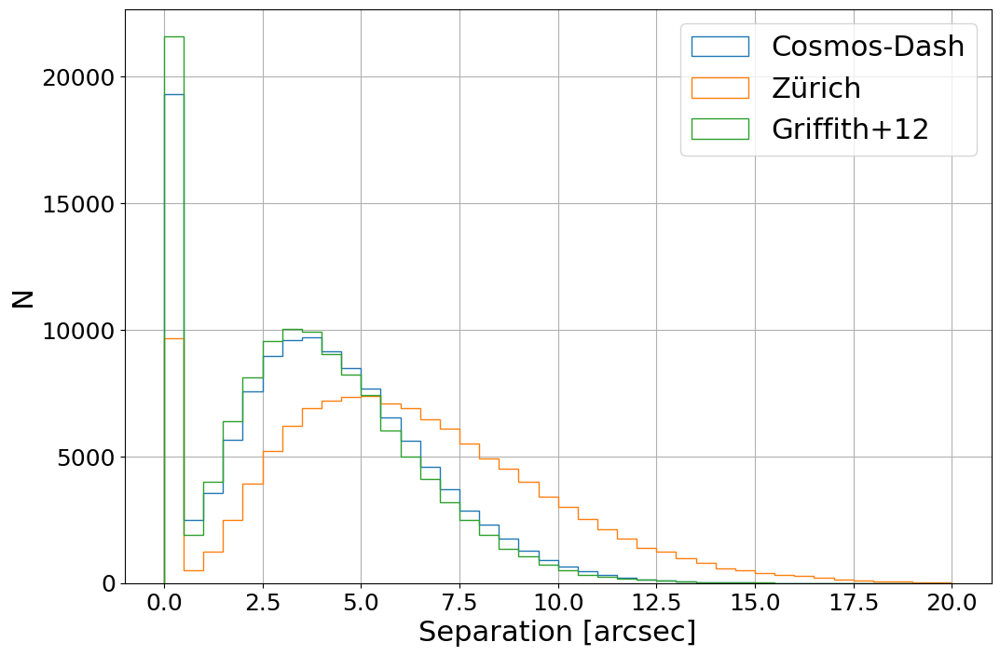

In [141]:
sep_bins = np.linspace(0,20,41)
plt.hist(sep2d_hstD.arcsec, histtype='step', label='Cosmos-Dash', bins=sep_bins)
plt.hist(sep2d_zurD.arcsec, histtype='step', label='Zürich', bins=sep_bins)
plt.hist(sep2d_griD.arcsec, histtype='step', label='Griffith+12', bins=sep_bins)
plt.legend(loc=0)
plt.xlabel('Separation [arcsec]')
plt.ylabel('N')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/separation_with_other_surveys_deep.png', format='png')
plt.show()

In [19]:
df_deep['match_hst'], df_deep['sep_hst'] = idx_hstD, sep2d_hstD.arcsec
df_deep['match_zur'], df_deep['sep_zur'] = idx_zurD, sep2d_zurD.arcsec
df_deep['match_gri'], df_deep['sep_gri'] = idx_griD, sep2d_griD.arcsec

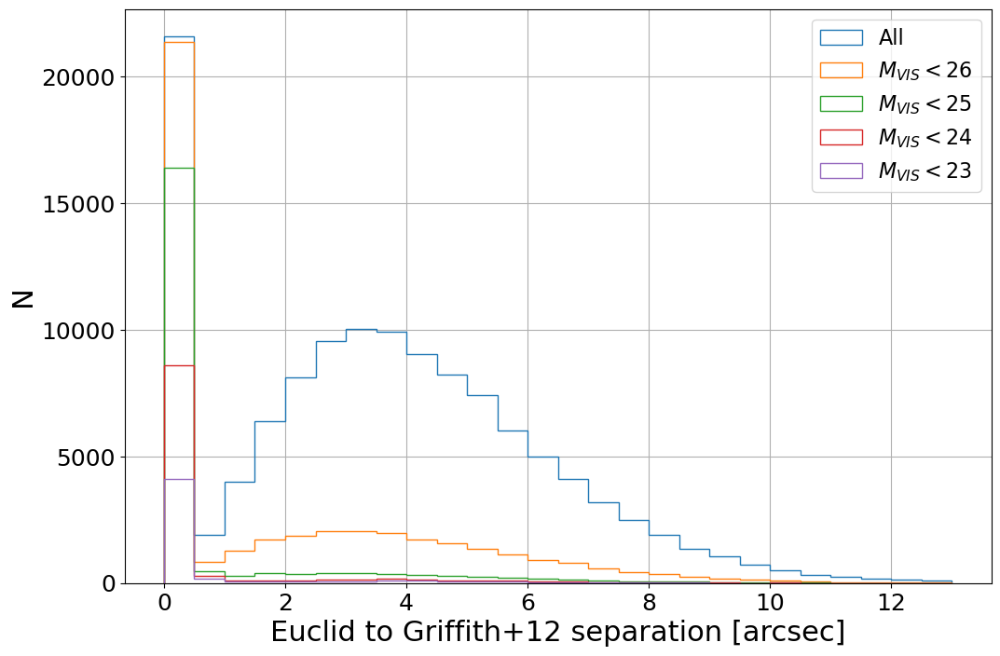

In [20]:
sep_bins = np.linspace(0,13,27)

sep = df_deep.sep_gri
plt.hist(sep, histtype='step', label='All', bins=sep_bins)

for mag_lim in [26,25,24,23]:
    sep = df_deep[df_deep.MAG_VIS_SERSIC < mag_lim].sep_gri
    plt.hist(sep, histtype='step', label='$M_{VIS} < $'+str(mag_lim), bins=sep_bins)

plt.legend(loc=0, fontsize=16)
plt.xlabel('Euclid to Griffith+12 separation [arcsec]')
plt.ylabel('N')
#plt.yscale('log')
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/separation_with_Griffith_mag_effect_deep.png', format='png')
plt.grid()
plt.show()

In [21]:
df_deep = df_deep.merge(df_hst, left_on='match_hst', right_index=True, how='left', suffixes=[None, '_hst'])
df_deep = df_deep.merge(df_zur, left_on='match_zur', right_index=True, how='left', suffixes=[None, '_zur'])
df_deep = df_deep.merge(df_gri, left_on='match_gri', right_index=True, how='left', suffixes=[None, '_gri'])

In [22]:
df_deep.columns.values

array(['OBJECT_ID', 'RIGHT_ASCENSION', 'DECLINATION',
       'SEGMENTATION_MAP_ID', 'VIS_DET', 'FLUX_VIS_APER', 'FLUX_Y_APER',
       'FLUX_J_APER', 'FLUX_H_APER', 'FLUX_NIR_STACK_APER',
       'FLUX_G_EXT_HSC_APER', 'FLUX_Z_EXT_HSC_APER', 'FLUXERR_VIS_APER',
       'FLUXERR_Y_APER', 'FLUXERR_J_APER', 'FLUXERR_H_APER',
       'FLUXERR_NIR_STACK_APER', 'FLUXERR_G_EXT_HSC_APER',
       'FLUXERR_Z_EXT_HSC_APER', 'FLUX_Y_TEMPLFIT', 'FLUX_J_TEMPLFIT',
       'FLUX_H_TEMPLFIT', 'FLUX_G_EXT_HSC_TEMPLFIT',
       'FLUX_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_Y_TEMPLFIT',
       'FLUXERR_J_TEMPLFIT', 'FLUXERR_H_TEMPLFIT',
       'FLUXERR_G_EXT_HSC_TEMPLFIT', 'FLUXERR_Z_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Y_TEMPLFIT', 'FLUX_VIS_TO_J_TEMPLFIT',
       'FLUX_VIS_TO_H_TEMPLFIT', 'FLUX_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_VIS_TO_Y_TEMPLFIT',
       'FLUXERR_VIS_TO_J_TEMPLFIT', 'FLUXERR_VIS_TO_H_TEMPLFIT',
       'FLUXERR_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUXERR_V

## Compare results

In [23]:
mag_bins_VIS = np.array([18.,20.,22.,23.,23.5,24.,24.5,25.,25.5,26.,27.,28.,30])
mag_bins_814 = np.array([18,20,21,22,22.5,23,23.5,24,24.5,25,25.5,26])
mag_bins_160 = np.array([17,20,21,21.5,22,22.5,23,23.5,24,24.5])

### vs Griffith+12

In [24]:
df_deep[df_deep.sep_gri < 1].shape[0], df_gri.columns

(23488,
 Index(['ObjNo', 'RAJ2000', 'DEJ2000', 'f1', 'f2', 'z', 'umag', 'gmag', 'rmag',
        'imag', 'Class', 'mu1', 'mu2', 'Sf1', 'Gf1', 's/g1', 's/g2', 'mGal1',
        'e_mGal1', 'mGal2', 'e_mGal2', 'Re.G1', 'e_Re.G1', 'Re.G2', 'e_Re.G2',
        'n.G1', 'e_n.G1', 'n.G2', 'e_n.G2', 'b/a.G1', 'e_b/a.G1', 'b/a.G2',
        'e_b/a.G2', 'pa.G1', 'e_pa.G1', 'pa.G2', 'e_pa.G2'],
       dtype='object'))

23289
Median =  0.404
Quantiles: 10% = 0.045  / 25% = 0.203  / 75% = 0.787  / 90% = 1.889


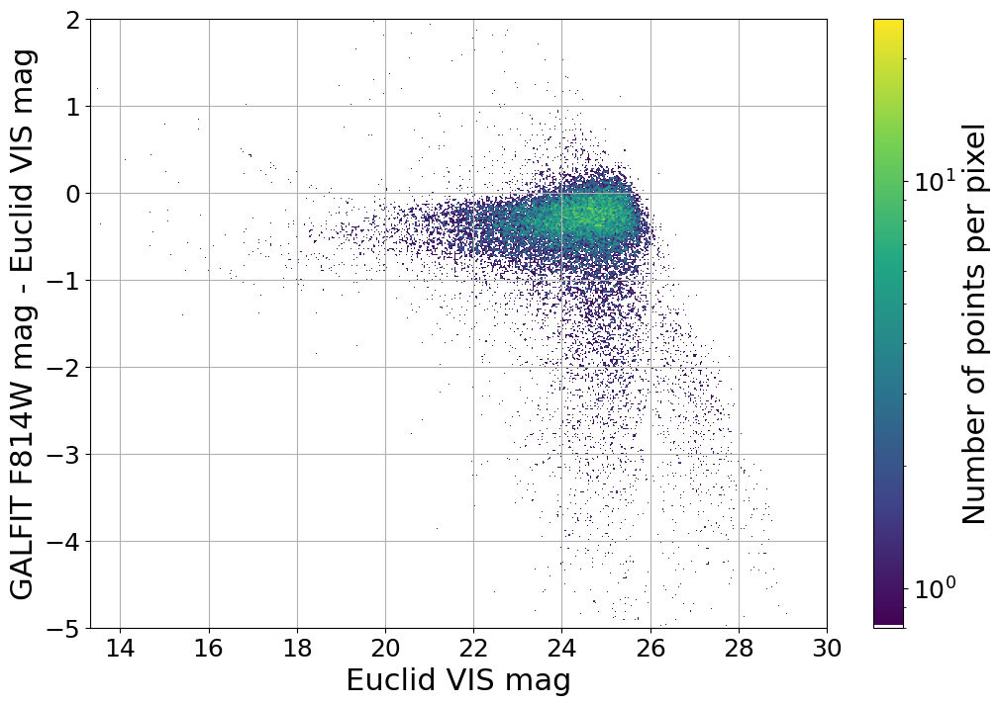

In [25]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1) & (df_deep.e_mGal1 < 3) & (df_deep.MAGERR_VIS_SERSIC < 3) & (df_deep.MAG_VIS_SERSIC > 0)]
print(df_plot.shape[0])

x, x_err = df_plot['MAG_VIS_SERSIC'].values, df_plot['MAGERR_VIS_SERSIC'].values
y, y_err = df_plot['mGal1'].values, df_plot['e_mGal1'].values

err_y = np.sqrt(x_err*x_err + y_err*y_err)

density = ax.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=25), cmap=white_viridis)

med = np.nanmedian(x-y)
q10 = np.quantile(x-y,0.10)
q25 = np.quantile(x-y,0.25)
q75 = np.quantile(x-y,0.75)
q90 = np.quantile(x-y,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

fig.colorbar(density, label='Number of points per pixel')
plt.xlabel('Euclid VIS mag')
plt.ylabel('GALFIT F814W mag - Euclid VIS mag')
plt.ylim(-5,2)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_photometry_plot_density_deep.png', format='png')
plt.show()

(23289, 267)
Median =  0.404
Quantiles: 10% = 0.045  / 25% = 0.203  / 75% = 0.787  / 90% = 1.889


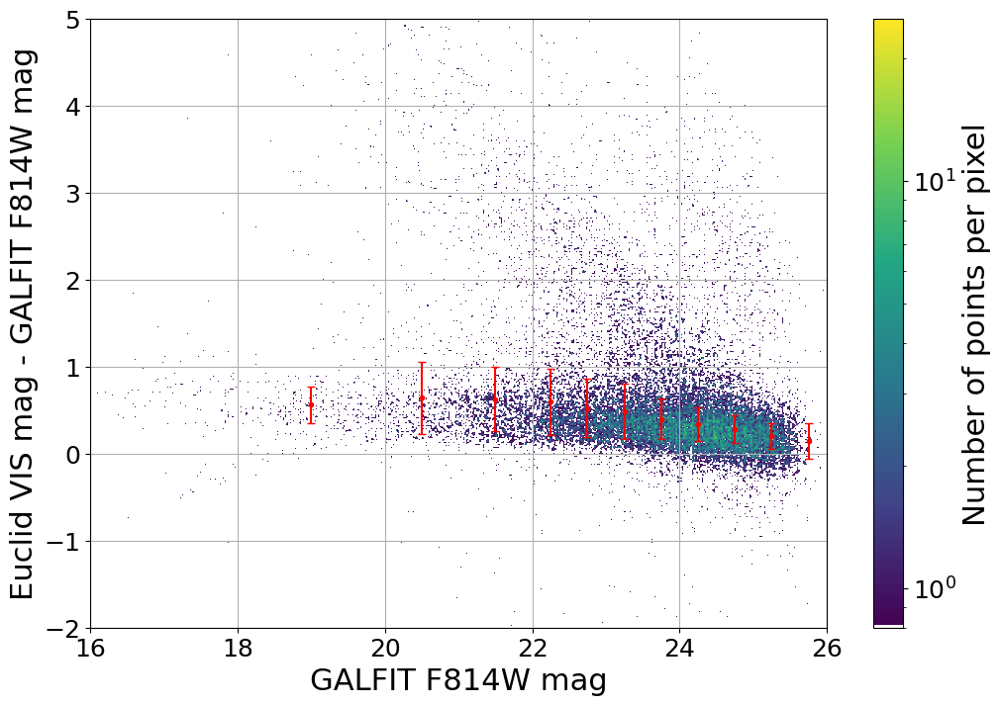

In [26]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1) & (df_deep.e_mGal1 < 3) & (df_deep.MAGERR_VIS_SERSIC < 3) & (df_deep.MAG_VIS_SERSIC > 0)]
print(df_plot.shape)

x, x_err = df_plot['MAG_VIS_SERSIC'].values, df_plot['MAGERR_VIS_SERSIC'].values
y, y_err = df_plot['mGal1'].values, df_plot['e_mGal1'].values

err_y = np.sqrt(x_err*x_err + y_err*y_err)

density = ax.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=0.8, vmax=25), cmap=white_viridis)

med = np.nanmedian(x-y)
q10 = np.quantile(x-y,0.10)
q25 = np.quantile(x-y,0.25)
q75 = np.quantile(x-y,0.75)
q90 = np.quantile(x-y,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['mGal1'].values, df_use['MAG_VIS_SERSIC'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

fig.colorbar(density, label='Number of points per pixel')
plt.xlabel('GALFIT F814W mag')
plt.ylabel('Euclid VIS mag - GALFIT F814W mag')
plt.xlim(16,26)
plt.ylim(-2,5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_photometry_plot_density_bis_deep.png', format='png')
plt.show()

Bias: Overall=0.4 Weighted=0.42
Dispersion : Overall=0.24 Weighted=0.26
Outlier %: Overall=0.18 Weighted=17.05


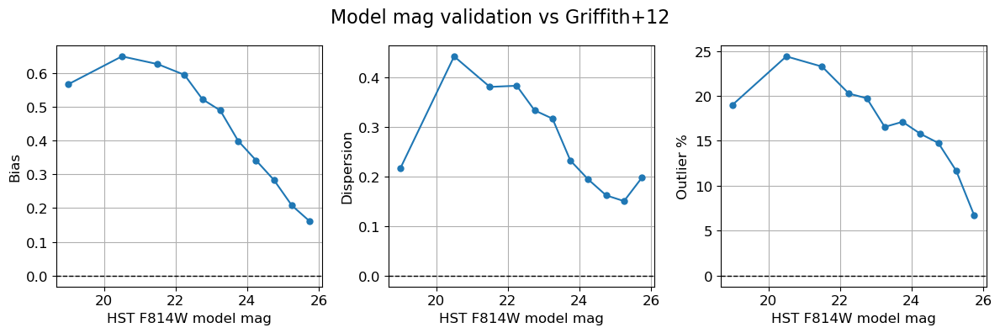

In [27]:
df_plot = df_deep[(df_deep.sep_gri < 1) & (df_deep.MAG_VIS_SERSIC > 0)]

x, y = df_plot['mGal1'].values, df_plot['MAG_VIS_SERSIC'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['mGal1'].values, df_use['MAG_VIS_SERSIC'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Model mag validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_magnitude_vs_Griffith12_deep.png', format='png')
plt.show()

23488
3296


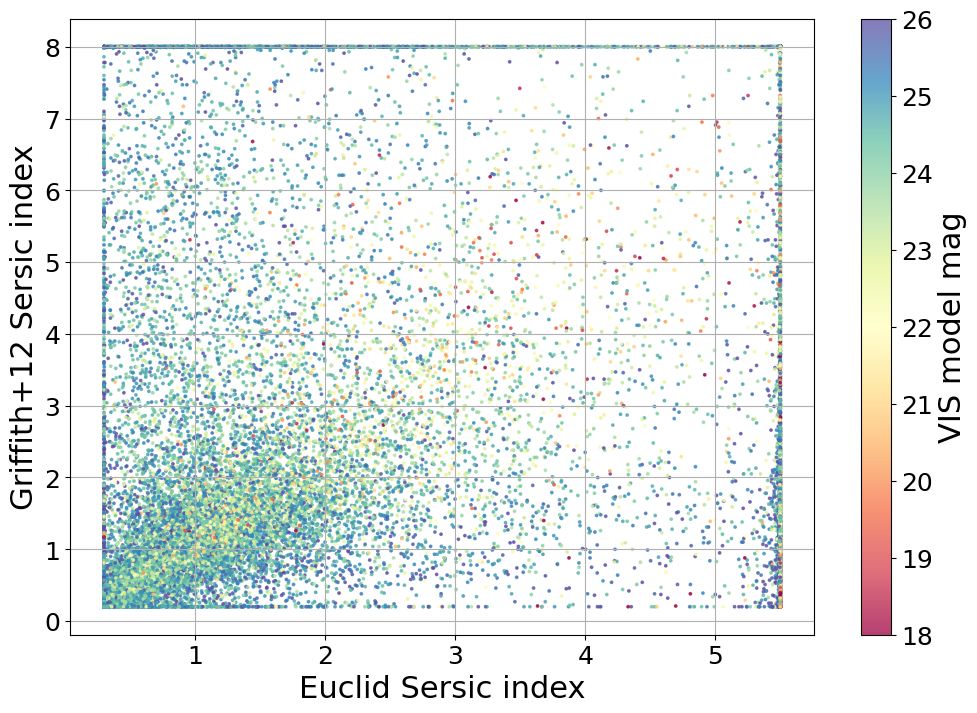

In [28]:
df_plot = df_deep[(df_deep.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n.G1'].values, df_plot['e_n.G1'].values
#z=df_plot['SERSIC_REDUCED_CHI2']
z=df_plot['MAG_VIS_SERSIC']

print(np.sum(x0 > 5.45))
#plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral_r', norm=mpl.colors.LogNorm(vmin=0.1, vmax=100))
plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=26))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
#cbar.set_label(r'SE++ Reduced $\chi_2$')
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid Sersic index')
plt.ylabel('Griffith+12 Sersic index')
#plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Sersic_index_deep.png', format='png')
plt.show()

16844
2298


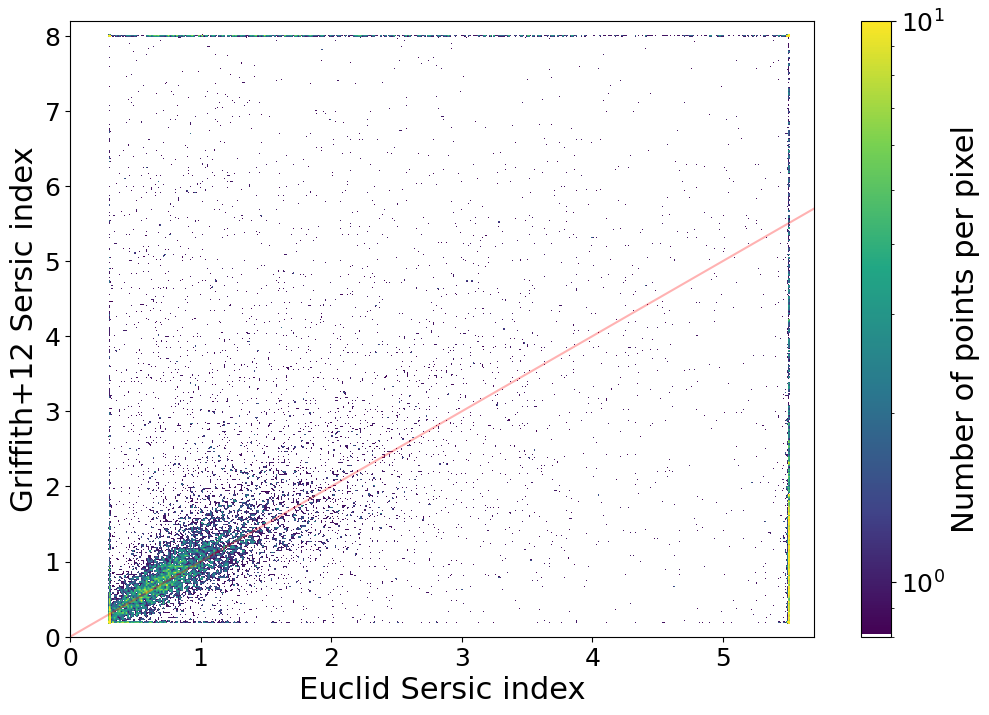

In [96]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1) & (df_deep.MAG_VIS_SERSIC < 25)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n.G1'].values, df_plot['e_n.G1'].values

print(np.sum(x0 > 5.45))

density = ax.scatter_density(x0, x1, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)

fig.colorbar(density, label='Number of points per pixel')

xa = np.linspace(0,10,100)
plt.plot(xa,xa,c='r', alpha=0.3)

plt.xlabel('Euclid Sersic index')
plt.ylabel('Griffith+12 Sersic index')
plt.xlim(0,5.7)
plt.ylim(0,8.2)
#plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Sersic_index_cut_mag25_deep.png', format='png')
plt.show()

Bias: Overall=-0.1 Weighted=-0.13
Dispersion : Overall=2.21 Weighted=2.2
Outlier %: Overall=0.0 Weighted=2.54


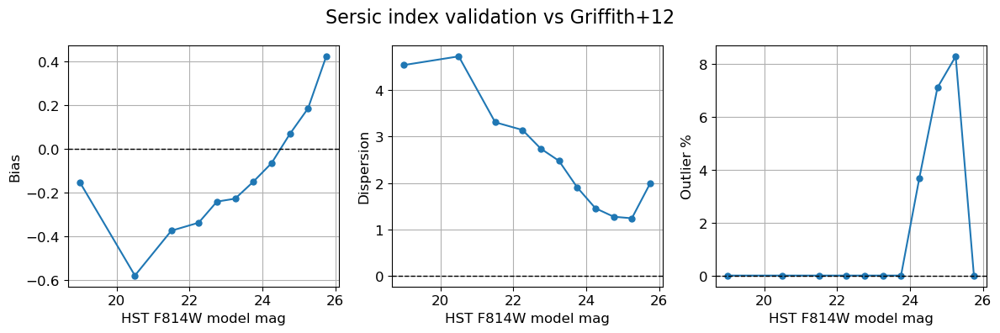

In [30]:
df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = df_plot['n.G1'].values, df_plot['SERSIC_SERSIC_INDEX'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_index_vs_Griffith12_deep.png', format='png')
plt.show()

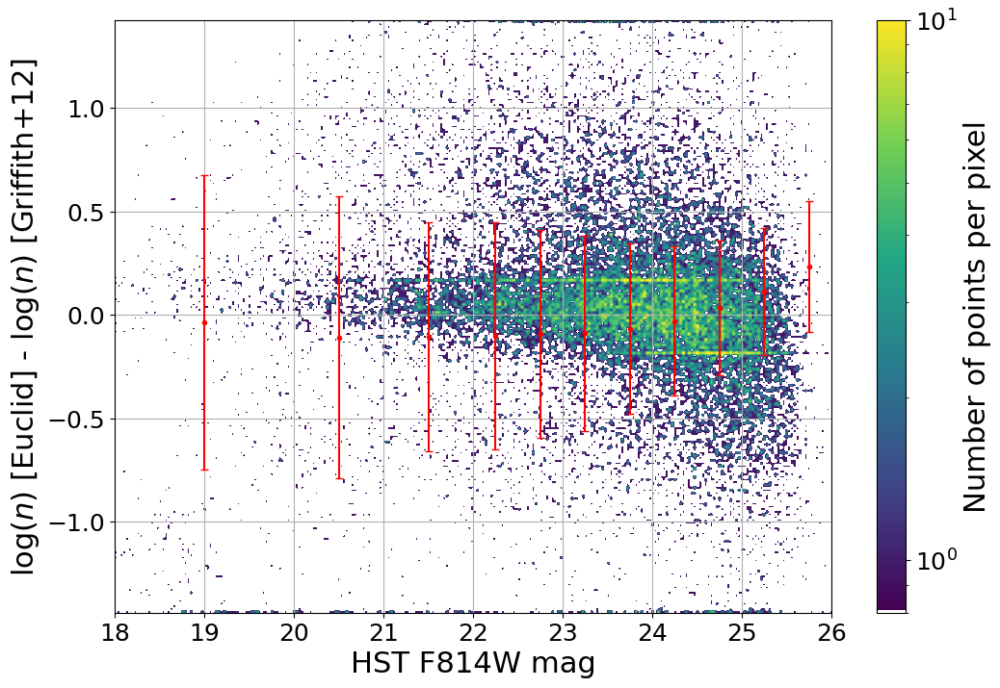

In [101]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1)]

x, xerr = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
y, yerr = df_plot['n.G1'].values, df_plot['e_n.G1'].values

z = df_plot['mGal1'].values

density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis, dpi=40)
#plt.scatter(z, np.log10(y/x), alpha=0.5, s=3)

fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel(r'$\log(n)$ [Euclid] - $\log(n)$ [Griffith+12]')
plt.xlim(18,26)
#plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/log_sersic_index_diff_Griffith12_vs_mag_deep.png', format='png')
plt.show()

Bias: Overall=-0.04 Weighted=-0.03
Dispersion : Overall=0.44 Weighted=0.43
Outlier %: Overall=0.02 Weighted=1.16


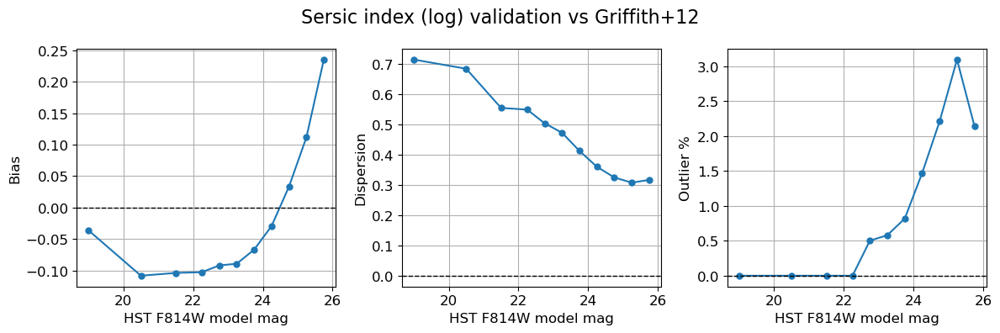

In [32]:
df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = df_plot['n.G1'].values, df_plot['SERSIC_SERSIC_INDEX'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index (log) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_log_sersic_index_vs_Griffith12_deep.png', format='png')
plt.show()

6467
Median =  1.042
Quantiles: 10% = 0.621  / 25% = 0.907  / 75% = 1.461  / 90% = 5.185


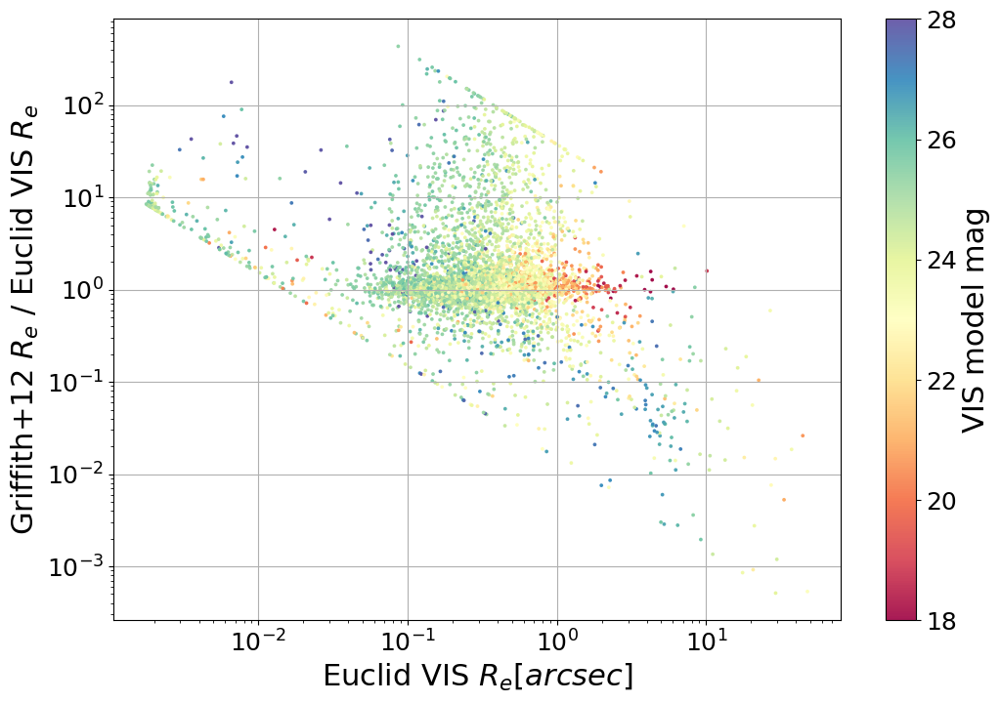

In [118]:
df_plot = df_deep[(df_deep.sep_gri < 1) & (df_deep.re > 0)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_RADIUS'].values, df_plot['SERSIC_SERSIC_RADIUS_ERR'].values
x1, x1err = 0.05*df_plot['Re.G1'].values, 0.05*df_plot['e_Re.G1'].values
z=df_plot['MAG_VIS_SERSIC']

med = np.nanmedian(x1/x0)
q10 = np.quantile(x1/x0,0.10)
q25 = np.quantile(x1/x0,0.25)
q75 = np.quantile(x1/x0,0.75)
q90 = np.quantile(x1/x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1/x0, s=3, alpha=0.9, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid VIS $R_e [arcsec]$')
plt.ylabel('Griffith+12 $R_e$ / Euclid VIS $R_e$')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Re_deep.png', format='png')
plt.show()

Bias: Overall=-0.02 Weighted=-0.03
Dispersion : Overall=0.29 Weighted=0.33
Outlier %: Overall=0.03 Weighted=4.1


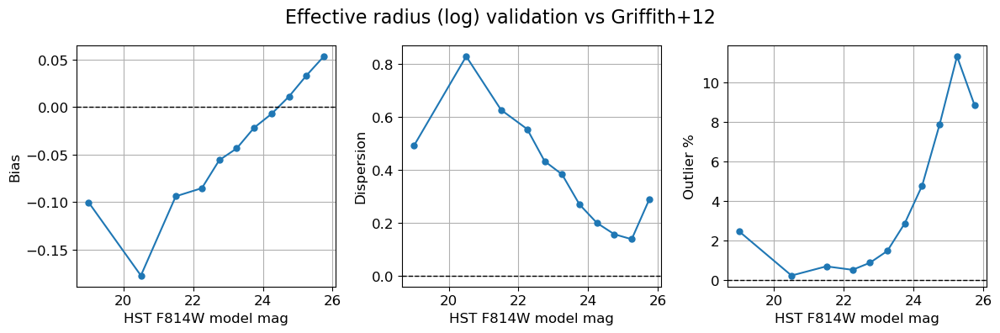

In [142]:
df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (log) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_vs_Griffith12_deep.png', format='png')
plt.show()

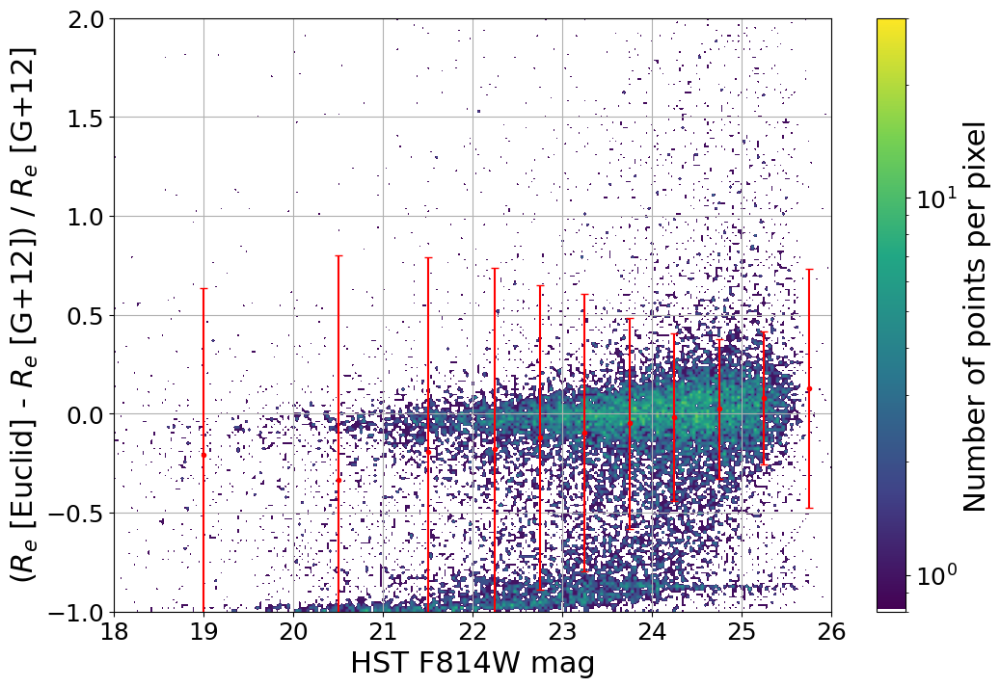

In [116]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values
z = df_plot['mGal1'].values

density=ax.scatter_density(z, (y-x)/x, norm=mpl.colors.LogNorm(vmin=0.8,vmax=30), cmap=white_viridis, dpi=40)
#plt.scatter(z, (y-x)/x, alpha=0.5, s=3)

fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel(r'($R_e$ [Euclid] - $R_e$ [G+12]) / $R_e$ [G+12]')
plt.xlim(18,26)
plt.ylim(-1.0,2.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/re_variation_vs_Griffith12_mag_deep.png', format='png')
plt.show()

Bias: Overall=-0.05 Weighted=-0.07
Dispersion : Overall=0.58 Weighted=0.61
Outlier %: Overall=0.06 Weighted=6.8


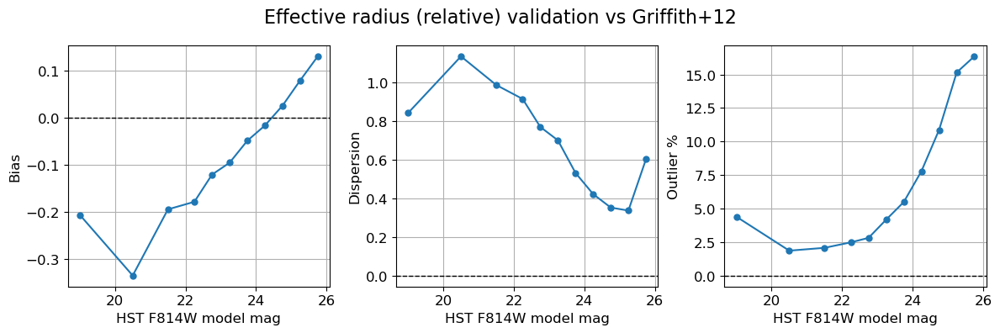

In [36]:
df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values 

b = (y-x)/x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values 
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (relative) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_rel_vs_Griffith12_deep.png', format='png')
plt.show()

23488


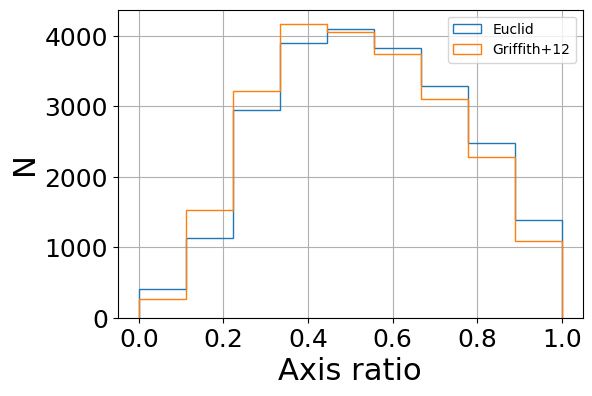

In [103]:
plt.figure(figsize=(6,4))

df_plot = df_deep[(df_deep.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_AXIS_RATIO'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO_ERR'].values
x1, x1err = df_plot['b/a.G1'].values, df_plot['e_b/a.G1'].values

plt.hist(x0, bins = np.linspace(0,1,10), histtype='step', label='Euclid')
plt.hist(x1, bins = np.linspace(0,1,10), histtype='step', label='Griffith+12')

plt.legend(fontsize=10)
plt.xlabel('Axis ratio')
plt.ylabel('N')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/hist_axis_ratio_vs_Griffith12_deep.png', format='png')
plt.show()

23488
Median =  0.967
Quantiles: 10% = 0.670  / 25% = 0.843  / 75% = 1.088  / 90% = 1.363


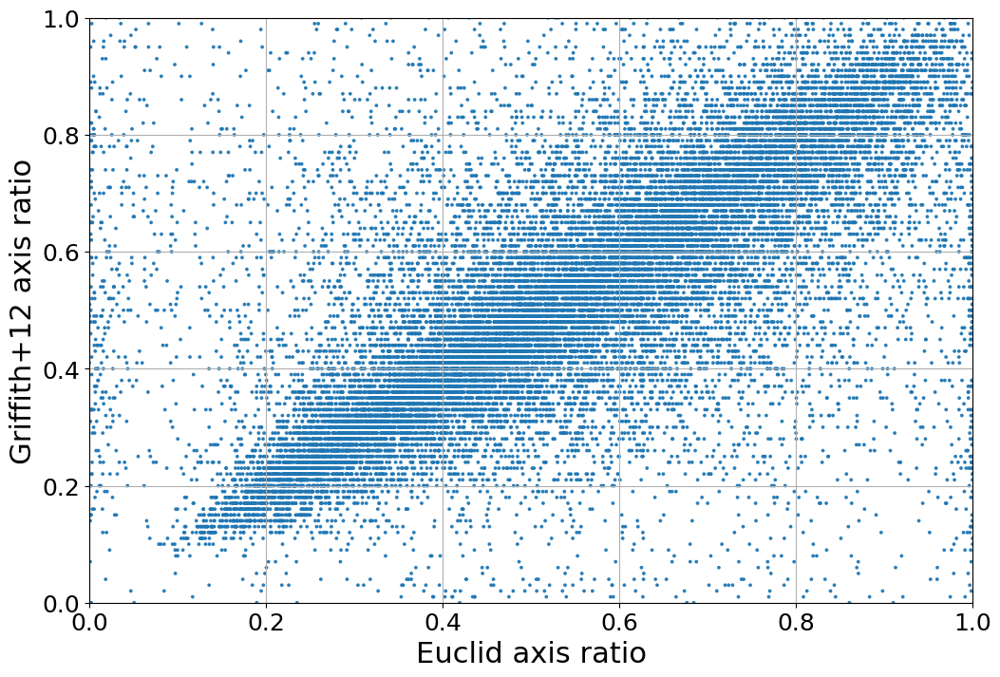

In [117]:
df_plot = df_deep[(df_deep.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_AXIS_RATIO'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO_ERR'].values
x1, x1err = df_plot['b/a.G1'].values, df_plot['e_b/a.G1'].values

med = np.nanmedian(x1/x0)
q10 = np.quantile(x1/x0,0.10)
q25 = np.quantile(x1/x0,0.25)
q75 = np.quantile(x1/x0,0.75)
q90 = np.quantile(x1/x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1, s=3, alpha=0.9, ls='')
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

plt.xlabel('Euclid axis ratio')
plt.ylabel('Griffith+12 axis ratio')
#plt.xscale('log')
#plt.yscale('log')
plt.xlim(0,1)
plt.ylim(0,1)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_axis_ratio_deep.png', format='png')
plt.show()

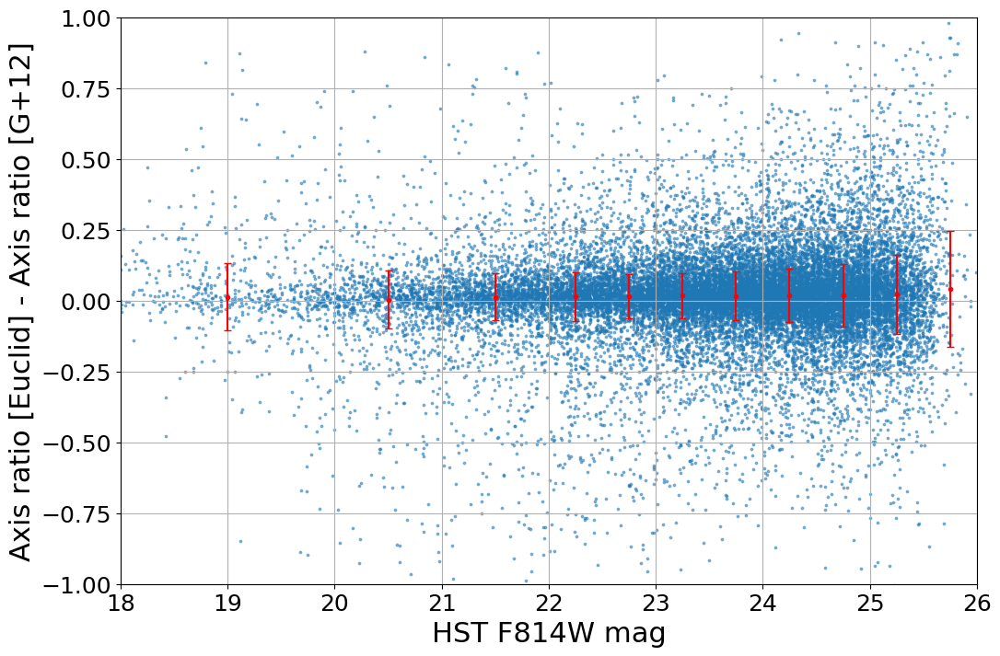

In [39]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = df_plot['b/a.G1'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values

z = df_plot['mGal1'].values

#density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, y-x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['b/a.G1'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel('Axis ratio [Euclid] - Axis ratio [G+12]')
plt.xlim(18,26)
plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/axis_ratio_variation_vs_Griffith12_mag_deep.png', format='png')
plt.show()

Bias: Overall=0.02 Weighted=0.02
Dispersion : Overall=0.1 Weighted=0.1
Outlier %: Overall=0.05 Weighted=4.31


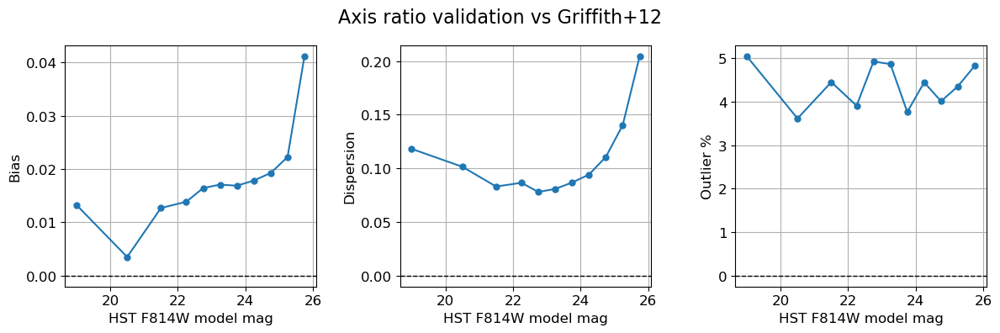

In [40]:
df_plot = df_deep[(df_deep.sep_gri < 1)]

x, y = df_plot['b/a.G1'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values 

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['b/a.G1'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Axis ratio validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_axis-ratio_vs_Griffith12_deep.png', format='png')
plt.show()

### vs CosmosDash catalog

In [139]:
df_deep[(df_deep.sep_hst < 1)].shape[0], df_wide[(df_wide.sep_hst < 1)].shape[0]

(21767, 22769)

In [138]:
df_deep[(df_deep.sep_hst < 1) & (df_deep.use==1)].shape[0], df_wide[(df_wide.sep_hst < 1) & (df_wide.use==1)].shape[0]

(3995, 4357)

In [126]:
df_deep[(df_deep.sep_hst < 1) & (df_deep.use==1)].shape[0], df_hst.columns

(3995,
 Index(['ID', 'RA', 'DEC', 'flag', 'use', 'mag', 'dmag', 're', 'dre', 'n', 'dn',
        'q', 'dq', 'pa', 'dpa', 'kron', 'f_F160W_auto', 'e_F160W_auto',
        'f_F160W_tot', 'e_F160W_tot', 'snr', 'flag_limit_r', 'flag_limit_n',
        'flag_deb', 'Mcorr', '5_sigma_depth', 'chi', 'chi_nu', 'mag_F160W_auto',
        'mag_err_F160W_auto', 'mag_F160W_tot', 'mag_err_F160W_tot'],
       dtype='object'))

3978
Median =  0.017
Quantiles: 10% = -0.530  / 25% = -0.210  / 75% = 0.020  / 90% = 0.160
Median =  0.017
Quantiles: 10% = -0.260  / 25% = -0.080  / 75% = 0.300  / 90% = 0.520


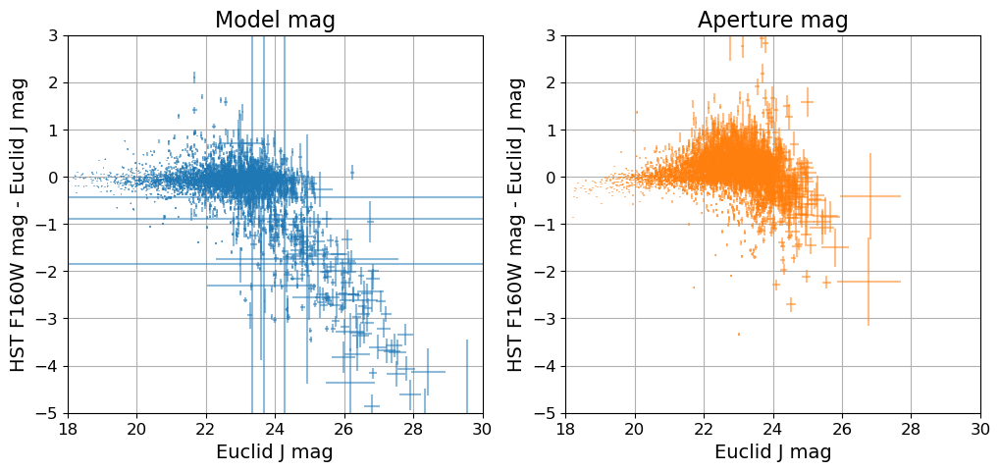

In [42]:
fig, axs = plt.subplots(1, 2, sharex=True, figsize=(12,5))

df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.mag > -99) & (df_deep.use==1) &
                  (df_deep.MAGERR_J_APER > 0) & (df_deep.MAGERR_J_SERSIC> 0)]
print(df_plot.shape[0])

x0, x0_err = df_plot['MAG_J_SERSIC'].values, df_plot['MAGERR_J_SERSIC'].values
y0, y0_err = df_plot['mag'].values, df_plot['dmag'].values

x1, x1_err = df_plot['MAG_J_APER'].values, df_plot['MAGERR_J_APER'].values
y1, y1_err = df_plot['mag_F160W_auto'].values, df_plot['mag_err_F160W_auto'].values
y2, y2_err = df_plot['mag_F160W_tot'].values, df_plot['mag_err_F160W_tot'].values

err_y0 = np.sqrt(x0_err*x0_err + y0_err*y0_err)
err_y1 = np.sqrt(x1_err*x1_err + y1_err*y1_err)
err_y2 = np.sqrt(x1_err*x1_err + y2_err*y2_err)

axs[0].errorbar(x0, y0-x0, xerr=x0_err, yerr=err_y0, markersize=2, alpha=0.5, ls='')
axs[1].errorbar(x1, y2-x1, xerr=x1_err, yerr=err_y2, markersize=2, alpha=0.5, ls='', c='tab:orange')

q10 = np.round(np.quantile(y0-x0,0.10),2)
q25 = np.round(np.quantile(y0-x0,0.25),2)
q75 = np.round(np.quantile(y0-x0,0.75),2)
q90 = np.round(np.quantile(y0-x0,0.90),2)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[0].set_title('Model mag', fontsize = 16)

q10 = np.round(np.quantile(y2-x1,0.10),2)
q25 = np.round(np.quantile(y2-x1,0.25),2)
q75 = np.round(np.quantile(y2-x1,0.75),2)
q90 = np.round(np.quantile(y2-x1,0.90),2)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[1].set_title('Aperture mag', fontsize = 16)

for ax in axs.flat:
    ax.set_xlabel('Euclid J mag', fontsize = 14)
    ax.set_ylabel('HST F160W mag - Euclid J mag', fontsize = 14)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.set(xlim=(18,30))
    ax.set(ylim=(-5,3))

plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_CosmosDash_photometry_deep.png', format='png')
plt.show()

3978
Median =  0.084
Quantiles: 10% = -0.163  / 25% = -0.021  / 75% = 0.213  / 90% = 0.531
Median =  -0.076
Quantiles: 10% = -0.515  / 25% = -0.297  / 75% = 0.079  / 90% = 0.257


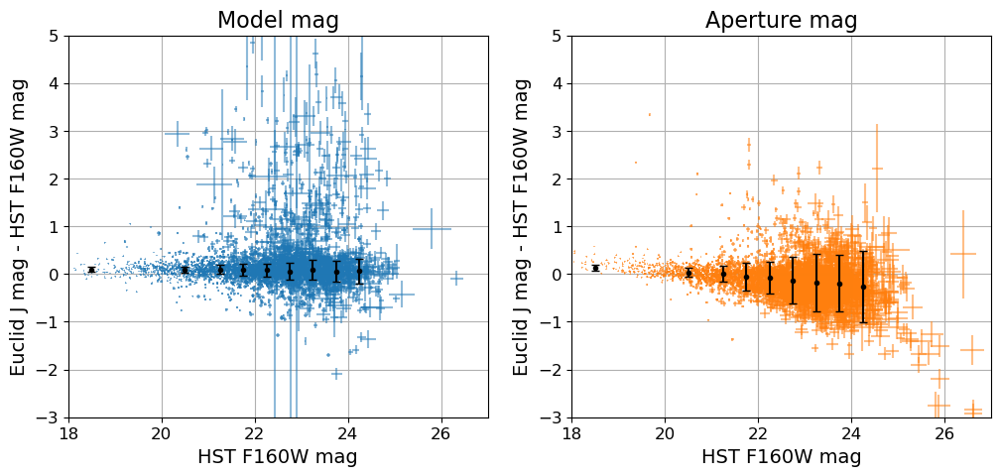

In [135]:
fig, axs = plt.subplots(1, 2, sharex=True, figsize=(12,5))

df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.mag > -99) & (df_deep.use==1) &
                  (df_deep.MAGERR_J_APER > 0) & (df_deep.MAGERR_J_SERSIC> 0)]
print(df_plot.shape[0])

x0, x0_err = df_plot['MAG_J_SERSIC'].values, df_plot['MAGERR_J_SERSIC'].values
y0, y0_err = df_plot['mag'].values, df_plot['dmag'].values

x1, x1_err = df_plot['MAG_J_APER'].values, df_plot['MAGERR_J_APER'].values
y1, y1_err = df_plot['mag_F160W_auto'].values, df_plot['mag_err_F160W_auto'].values
y2, y2_err = df_plot['mag_F160W_tot'].values, df_plot['mag_err_F160W_tot'].values

err_y0 = np.sqrt(x0_err*x0_err + y0_err*y0_err)
err_y1 = np.sqrt(x1_err*x1_err + y1_err*y1_err)
err_y2 = np.sqrt(x1_err*x1_err + y2_err*y2_err)

axs[0].errorbar(y0, x0-y0, xerr=y0_err, yerr=err_y0, markersize=2, alpha=0.5, ls='')
axs[1].errorbar(y2, x1-y2, xerr=y2_err, yerr=err_y2, markersize=2, alpha=0.5, ls='', c='tab:orange')

med = np.nanmedian(x0-y0)
q10 = np.quantile(x0-y0,0.10)
q25 = np.quantile(x0-y0,0.25)
q75 = np.quantile(x0-y0,0.75)
q90 = np.quantile(x0-y0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)
axs[0].set_title('Model mag', fontsize = 16)

med = np.nanmedian(x1-y2)
q10 = np.quantile(x1-y2,0.10)
q25 = np.quantile(x1-y2,0.25)
q75 = np.quantile(x1-y2,0.75)
q90 = np.quantile(x1-y2,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)
axs[1].set_title('Aperture mag', fontsize = 16)

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
B2, D2 = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x0, y0 = df_use['mag'].values, df_use['MAG_J_SERSIC'].values 
        b0 = y0-x0
        B[k] = np.median(b0)
        D[k] = np.quantile(np.abs(b0)-B[k], 0.68)
    df_use_bis = df_plot[(df_plot.mag_F160W_tot >= m1) & (df_plot.mag_F160W_tot < m2)]
    if df_use_bis.shape[0] > 10 :
        x2, y2 = df_use_bis['mag_F160W_tot'].values, df_use_bis['MAG_J_APER'].values 
        b2 = y2-x2
        B2[k] = np.median(b2)
        D2[k] = np.quantile(np.abs(b2)-B2[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
axs[0].errorbar(X, B, yerr=D, markersize=3, color='k', capsize=3, fmt='o')
axs[1].errorbar(X, B2, yerr=D2, markersize=3, color='k', capsize=3, fmt='o')

for ax in axs.flat:
    ax.set_xlabel('HST F160W mag', fontsize = 14)
    ax.set_ylabel('Euclid J mag - HST F160W mag', fontsize = 14)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.set(xlim=(18,27))
    ax.set(ylim=(-3,5))

plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_J_CosmosDash_photometry_deep.png', format='png')
plt.show()

Model
Bias: Overall=0.08 Weighted=0.08
Dispersion : Overall=0.13 Weighted=0.15
Outlier %: Overall=0.11 Weighted=11.0
Aperture
Bias: Overall=-0.08 Weighted=-0.1
Dispersion : Overall=0.39 Weighted=0.41
Outlier %: Overall=0.01 Weighted=1.35


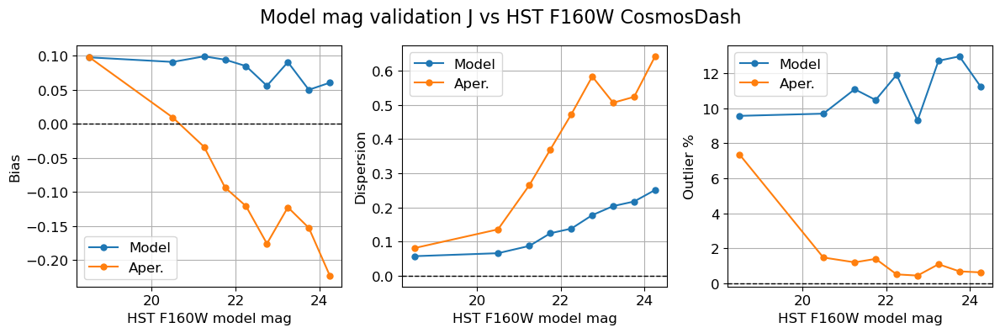

In [44]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.mag > -99) & (df_deep.use==1) &
                  (df_deep.MAGERR_J_APER > 0) & (df_deep.MAGERR_J_SERSIC> 0)]

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

for i in range(2):
    if i==0:
        x, y = df_plot['mag'].values, df_plot['MAG_J_SERSIC'].values 
        c='tab:blue'
        lab='Model'
    else:
        x, y = df_plot['mag_F160W_tot'].values, df_plot['MAG_J_APER'].values
        c='tab:orange'
        lab='Aper.'

    b = y-x
    med = np.median(b)
    disp = np.quantile(np.abs(b)-med, 0.68)
    outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

    nb = len(mag_bins_160)-1
    B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
    for k in range(nb):
        m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
        df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
        if df_use.shape[0] > 10 :
            if i==0:
                x, y = df_use['mag'].values, df_use['MAG_J_SERSIC'].values, 
            else:
                x, y = df_use['mag_F160W_tot'].values, df_use['MAG_J_APER'].values
            b = y-x
            B[k] = np.median(b)
            D[k] = np.quantile(np.abs(b)-B[k], 0.68)
            O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
        weight[k] = df_use.shape[0] / df_plot.shape[0]

    X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

    okB = np.isfinite(B)
    wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
    okD = np.isfinite(D)
    wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
    okO = np.isfinite(O)
    wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

    axs[0].plot(X, B, marker = 'o', markersize=5, c=c, label=lab)
    axs[1].plot(X, D, marker = 'o', markersize=5, c=c, label=lab)
    axs[2].plot(X, O, marker = 'o', markersize=5, c=c, label=lab)
    
    if i==0:
        print('Model')
    else:
        print('Aperture')
    print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
    print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
    print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

    axs[0].set_ylabel('Bias', fontsize = 12)
    axs[1].set_ylabel('Dispersion', fontsize = 12)
    axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.legend(fontsize = 12)

fig.suptitle('Model mag validation J vs HST F160W CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_mag_J_vs_CosmosDash_deep.png', format='png')
plt.show()

3981
Median =  -0.175
Quantiles: 10% = -0.428  / 25% = -0.288  / 75% = -0.052  / 90% = 0.251
Median =  -0.362
Quantiles: 10% = -0.770  / 25% = -0.547  / 75% = -0.197  / 90% = -0.025


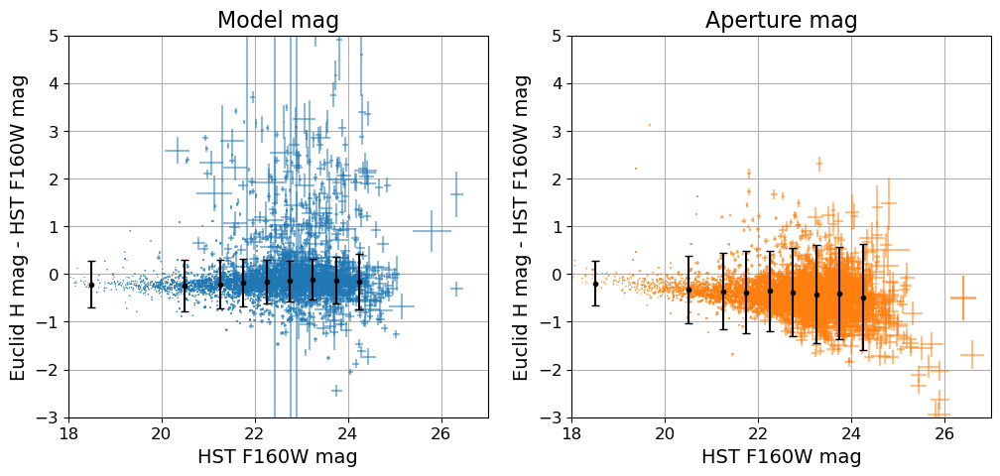

In [136]:
fig, axs = plt.subplots(1, 2, sharex=True, figsize=(12,5))

df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.mag > -99) & (df_deep.use==1) &
                  (df_deep.MAGERR_H_APER > 0) & (df_deep.MAGERR_H_SERSIC> 0)]
print(df_plot.shape[0])

x0, x0_err = df_plot['MAG_H_SERSIC'].values, df_plot['MAGERR_H_SERSIC'].values
y0, y0_err = df_plot['mag'].values, df_plot['dmag'].values

x1, x1_err = df_plot['MAG_H_APER'].values, df_plot['MAGERR_H_APER'].values
y1, y1_err = df_plot['mag_F160W_auto'].values, df_plot['mag_err_F160W_auto'].values
y2, y2_err = df_plot['mag_F160W_tot'].values, df_plot['mag_err_F160W_tot'].values

err_y0 = np.sqrt(x0_err*x0_err + y0_err*y0_err)
err_y1 = np.sqrt(x1_err*x1_err + y1_err*y1_err)
err_y2 = np.sqrt(x1_err*x1_err + y2_err*y2_err)

axs[0].errorbar(y0, x0-y0, xerr=y0_err, yerr=err_y0, markersize=2, alpha=0.5, ls='')
axs[1].errorbar(y2, x1-y2, xerr=y2_err, yerr=err_y2, markersize=2, alpha=0.5, ls='', c='tab:orange')

med = np.nanmedian(x0-y0)
q10 = np.quantile(x0-y0,0.10)
q25 = np.quantile(x0-y0,0.25)
q75 = np.quantile(x0-y0,0.75)
q90 = np.quantile(x0-y0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)
axs[0].set_title('Model mag', fontsize = 16)

med = np.nanmedian(x1-y2)
q10 = np.quantile(x1-y2,0.10)
q25 = np.quantile(x1-y2,0.25)
q75 = np.quantile(x1-y2,0.75)
q90 = np.quantile(x1-y2,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)
axs[1].set_title('Aperture mag', fontsize = 16)

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
B2, D2 = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x0, y0 = df_use['mag'].values, df_use['MAG_H_SERSIC'].values 
        b0 = y0-x0
        B[k] = np.median(b0)
        D[k] = np.quantile(np.abs(b0)-B[k], 0.68)
    df_use_bis = df_plot[(df_plot.mag_F160W_tot >= m1) & (df_plot.mag_F160W_tot < m2)]
    if df_use_bis.shape[0] > 10 :
        x2, y2 = df_use_bis['mag_F160W_tot'].values, df_use_bis['MAG_H_APER'].values 
        b2 = y2-x2
        B2[k] = np.median(b2)
        D2[k] = np.quantile(np.abs(b2)-B2[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
axs[0].errorbar(X, B, yerr=D, markersize=3, color='k', capsize=3, fmt='o')
axs[1].errorbar(X, B2, yerr=D2, markersize=3, color='k', capsize=3, fmt='o')

for ax in axs.flat:
    ax.set_xlabel('HST F160W mag', fontsize = 14)
    ax.set_ylabel('Euclid H mag - HST F160W mag', fontsize = 14)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.set(xlim=(18,27))
    ax.set(ylim=(-3,5))

plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_H_CosmosDash_photometry_deep.png', format='png')
plt.show()

Model
Bias: Overall=-0.18 Weighted=-0.17
Dispersion : Overall=0.48 Weighted=0.48
Outlier %: Overall=0.04 Weighted=3.66
Aperture
Bias: Overall=-0.36 Weighted=-0.37
Dispersion : Overall=0.87 Weighted=0.89
Outlier %: Overall=0.0 Weighted=0.08


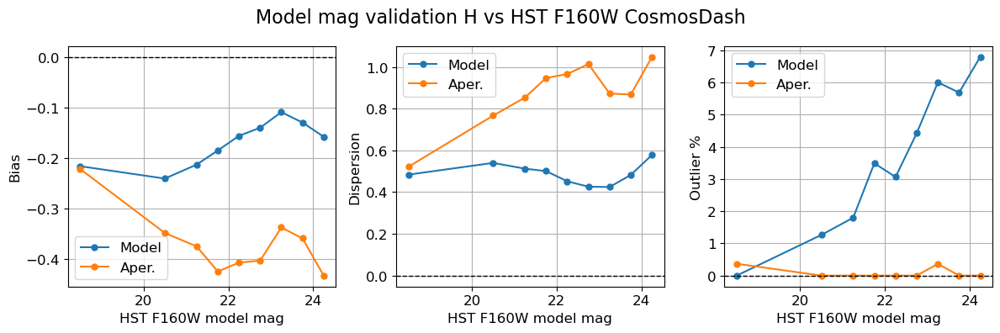

In [46]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.mag > -99) & (df_deep.use==1) &
                  (df_deep.MAGERR_H_APER > 0) & (df_deep.MAGERR_H_SERSIC> 0)]

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

for i in range(2):
    if i==0:
        x, y = df_plot['mag'].values, df_plot['MAG_H_SERSIC'].values 
        c='tab:blue'
        lab='Model'
    else:
        x, y = df_plot['mag_F160W_tot'].values, df_plot['MAG_H_APER'].values
        c='tab:orange'
        lab='Aper.'

    b = y-x
    med = np.median(b)
    disp = np.quantile(np.abs(b)-med, 0.68)
    outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

    nb = len(mag_bins_160)-1
    B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
    for k in range(nb):
        m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
        df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
        if df_use.shape[0] > 10 :
            if i==0:
                x, y = df_use['mag'].values, df_use['MAG_H_SERSIC'].values, 
            else:
                x, y = df_use['mag_F160W_tot'].values, df_use['MAG_H_APER'].values
            b = y-x
            B[k] = np.median(b)
            D[k] = np.quantile(np.abs(b)-B[k], 0.68)
            O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
        weight[k] = df_use.shape[0] / df_plot.shape[0]

    X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

    okB = np.isfinite(B)
    wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
    okD = np.isfinite(D)
    wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
    okO = np.isfinite(O)
    wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

    axs[0].plot(X, B, marker = 'o', markersize=5, c=c, label=lab)
    axs[1].plot(X, D, marker = 'o', markersize=5, c=c, label=lab)
    axs[2].plot(X, O, marker = 'o', markersize=5, c=c, label=lab)
    
    if i==0:
        print('Model')
    else:
        print('Aperture')
    print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
    print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
    print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))
    
    axs[0].set_ylabel('Bias', fontsize = 12)
    axs[1].set_ylabel('Dispersion', fontsize = 12)
    axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.legend(fontsize = 12)

fig.suptitle('Model mag validation H vs HST F160W CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_mag_H_vs_CosmosDash_deep.png', format='png')
plt.show()

3995


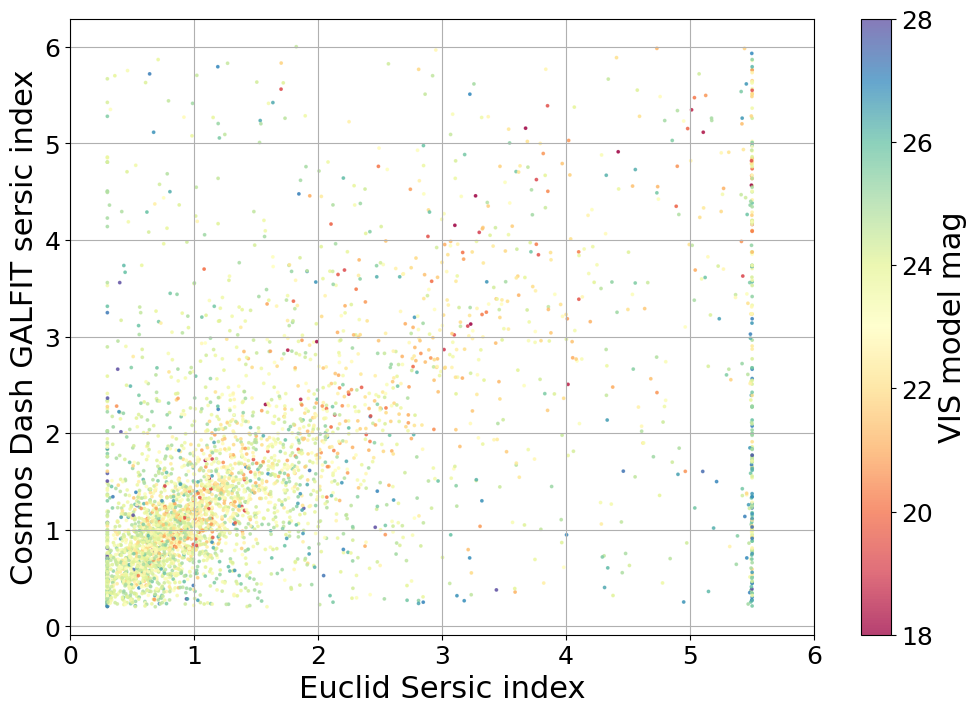

In [47]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.use==1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n'].values, df_plot['dn'].values
#z=df_plot['SERSIC_REDUCED_CHI2']
z=df_plot['MAG_VIS_SERSIC']

#plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral_r', norm=mpl.colors.LogNorm(vmin=0.1, vmax=100))
plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
#cbar.set_label(r'SE++ Reduced $\chi_2$')
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid Sersic index')
plt.ylabel('Cosmos Dash GALFIT sersic index')
plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_CosmosDash_Sersic_index_deep.png', format='png')
plt.show()

Bias: Overall=0.11 Weighted=0.11
Dispersion : Overall=0.57 Weighted=0.54
Outlier %: Overall=0.05 Weighted=4.68


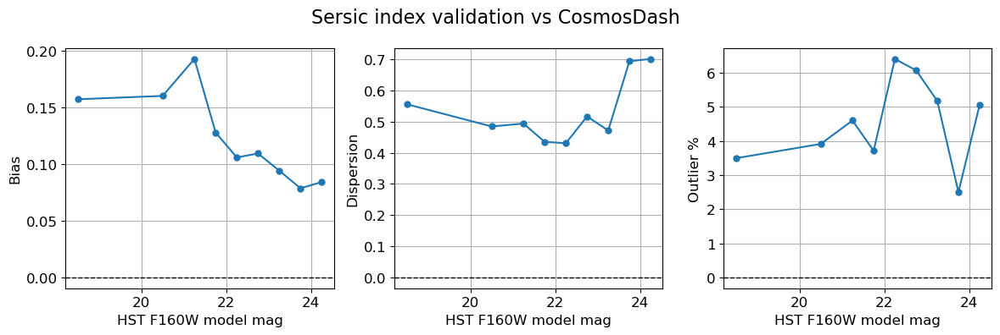

In [48]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.use==1)]

x, y = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['n'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['SERSIC_SERSIC_INDEX'].values, df_use['n'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))
    
axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_index_vs_CosmosDash_deep.png', format='png')
plt.show()

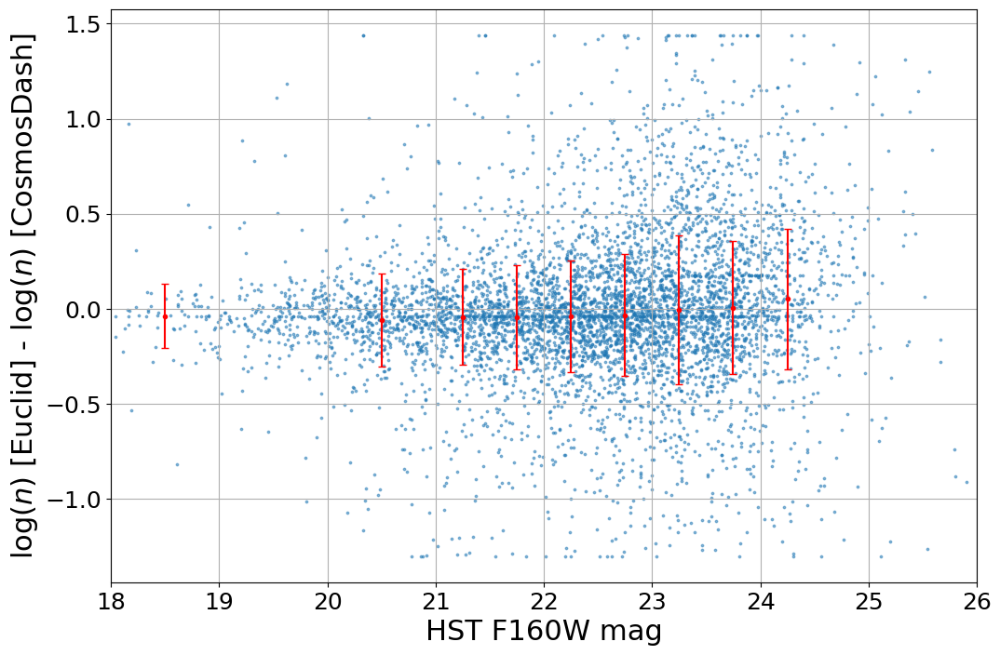

In [122]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['n'].values, df_plot['SERSIC_SERSIC_INDEX'].values 

z = df_plot['mag'].values

#density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, np.log10(y/x), alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n'].values, df_use['SERSIC_SERSIC_INDEX'].values 
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F160W mag')
plt.ylabel(r'$\log(n)$ [Euclid] - $\log(n)$ [CosmosDash]')
plt.xlim(18,26)
#plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/log_sersic_index_diff_CosmosDash_vs_mag_deep.png', format='png')
plt.show()

Bias: Overall=nan Weighted=-0.02
Dispersion : Overall=nan Weighted=0.31
Outlier %: Overall=0.0 Weighted=2.11


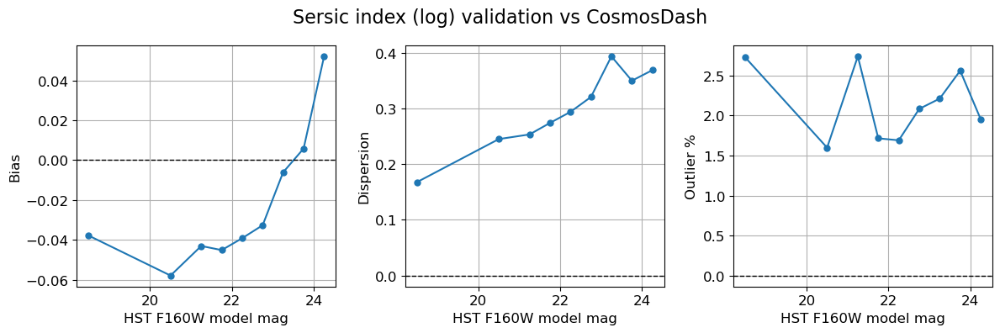

In [50]:
df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['n'].values, df_plot['SERSIC_SERSIC_INDEX'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index (log) validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_log_sersic_index_vs_CosmosDash_deep.png', format='png')
plt.show()

3995
Median =  0.905
Quantiles: 10% = 0.610  / 25% = 0.800  / 75% = 1.000  / 90% = 1.260


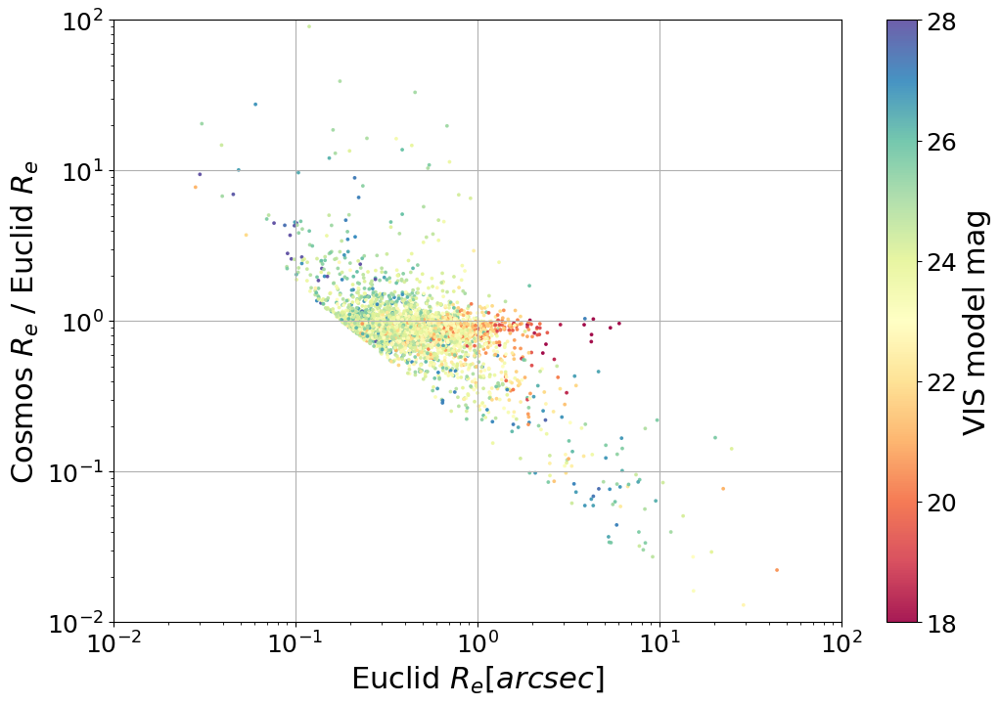

In [51]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.re > 0) & (df_deep.use==1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_RADIUS'].values, df_plot['SERSIC_SERSIC_RADIUS_ERR'].values
x1, x1err = df_plot['re'].values, df_plot['dre'].values
z=df_plot['MAG_VIS_SERSIC']

med = np.nanmedian(x1/x0)
q10 = np.round(np.quantile(x1/x0,0.10),2)
q25 = np.round(np.quantile(x1/x0,0.25),2)
q75 = np.round(np.quantile(x1/x0,0.75),2)
q90 = np.round(np.quantile(x1/x0,0.90),2)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1/x0, s=3, alpha=0.9, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid $R_e [arcsec]$')
plt.ylabel('Cosmos $R_e$ / Euclid $R_e$')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.01,100)
plt.ylim(0.01,100)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_CosmosDash_Re_deep.png', format='png')
plt.show()

Bias: Overall=0.04 Weighted=0.04
Dispersion : Overall=0.06 Weighted=0.06
Outlier %: Overall=0.09 Weighted=9.66


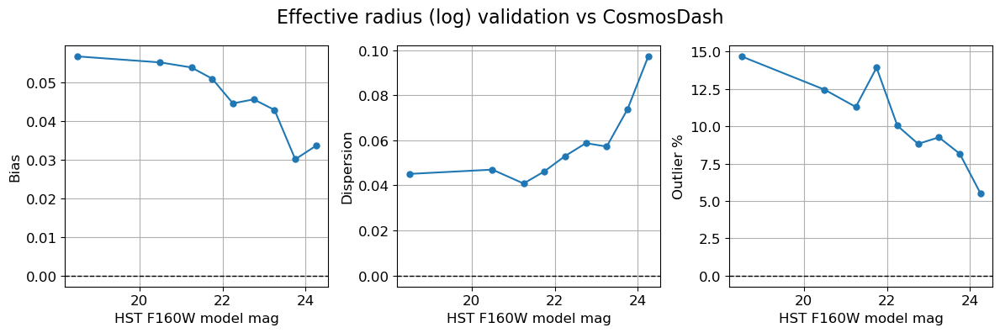

In [52]:
df_plot = df_deep[(df_deep.sep_hst < 1) & (df_deep.re > 0) & (df_deep.use==1)]

x, y = df_plot['re'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['re'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (log) validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_vs_CosmosDash_deep.png', format='png')
plt.show()

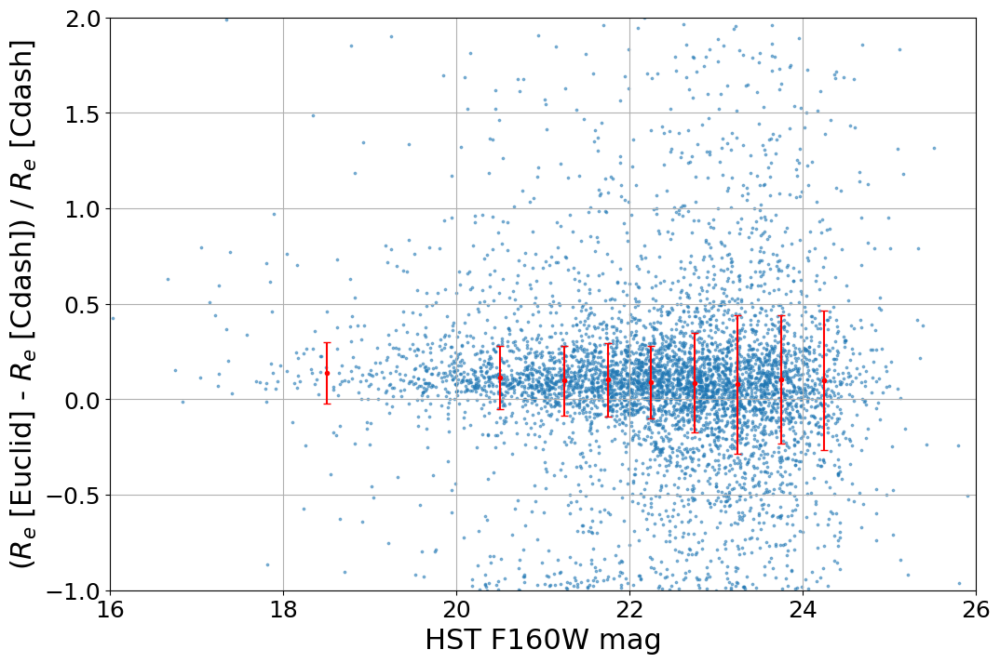

In [121]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['re'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

z = df_plot['mag'].values

#density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, (y-x)/x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['re'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F160W mag')
plt.ylabel(r'($R_e$ [Euclid] - $R_e$ [Cdash]) / $R_e$ [Cdash]')
plt.xlim(16,26)
plt.ylim(-1.0,2.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_diff_CosmosDash_vs_mag_deep.png', format='png')
plt.show()

Bias: Overall=-1.0 Weighted=0.1
Dispersion : Overall=2.01 Weighted=0.25
Outlier %: Overall=0.01 Weighted=11.13


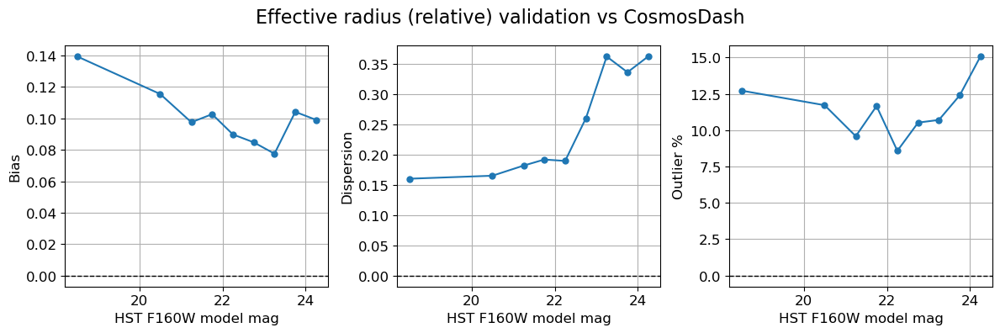

In [54]:
df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['re'].values, df_plot['SERSIC_SERSIC_RADIUS'].values 

b = (y-x)/x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['re'].values, df_use['SERSIC_SERSIC_RADIUS'].values 
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (relative) validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_rel_vs_CosmosDash_deep.png', format='png')
plt.show()

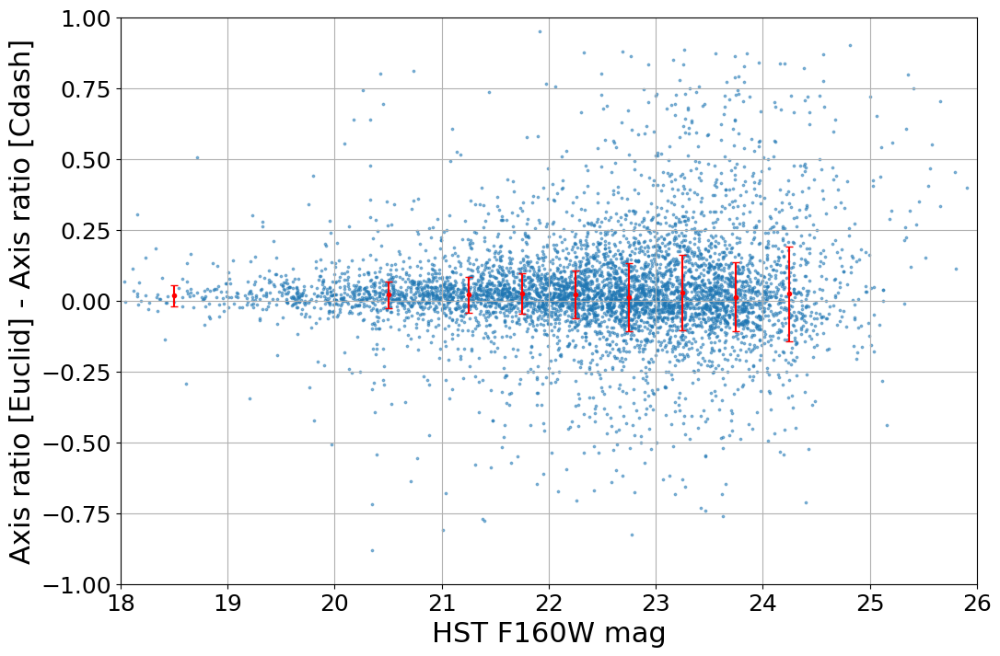

In [55]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['q'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values

z = df_plot['mag'].values

#density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, y-x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['q'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F160W mag')
plt.ylabel('Axis ratio [Euclid] - Axis ratio [Cdash]')
plt.xlim(18,26)
plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/axis_ratio_variation_vs_CosmosDash_mag_deep.png', format='png')
plt.show()

Bias: Overall=99.42 Weighted=0.02
Dispersion : Overall=0.16 Weighted=0.1
Outlier %: Overall=0.03 Weighted=5.71


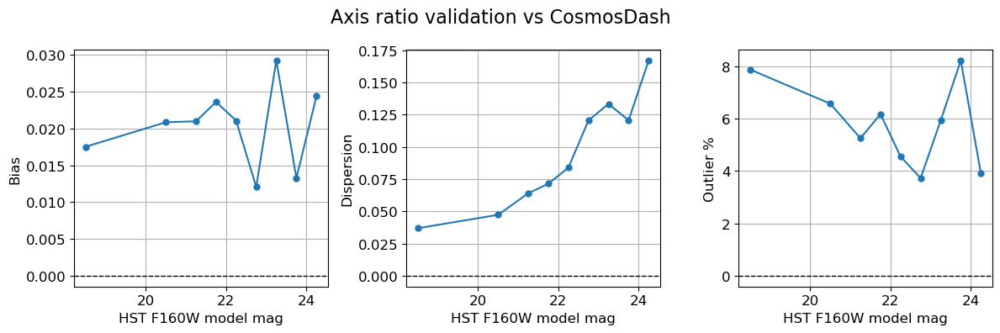

In [56]:
df_plot = df_deep[(df_deep.sep_hst < 1)]

x, y = df_plot['q'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values 

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['q'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Axis ratio validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_axis-ratio_vs_CosmosDash_deep.png', format='png')
plt.show()

## For the Wide case

### Perform cross-match

In [57]:
dfW_coords = SkyCoord(df_wide['RIGHT_ASCENSION'].values, df_wide['DECLINATION'].values, unit="deg")
coords_hst = SkyCoord(df_hst['RA'], df_hst['DEC'], unit="deg")
coords_zur = SkyCoord(df_zur['RA'], df_zur['DEC'], unit="deg")
coords_gri = SkyCoord(df_gri['RAJ2000'], df_gri['DEJ2000'], unit="deg")
idx_hstW, sep2d_hstW, _ = dfW_coords.match_to_catalog_sky(coords_hst)
idx_zurW, sep2d_zurW, _ = dfW_coords.match_to_catalog_sky(coords_zur)
idx_griW, sep2d_griW, _ = dfW_coords.match_to_catalog_sky(coords_gri)

In [58]:
len(dfW_coords), len(coords_hst), len(coords_zur), len(coords_gri), len(idx_hstW), len(idx_zurW), len(idx_griW)

(46990, 262615, 131532, 304688, 46990, 46990, 46990)

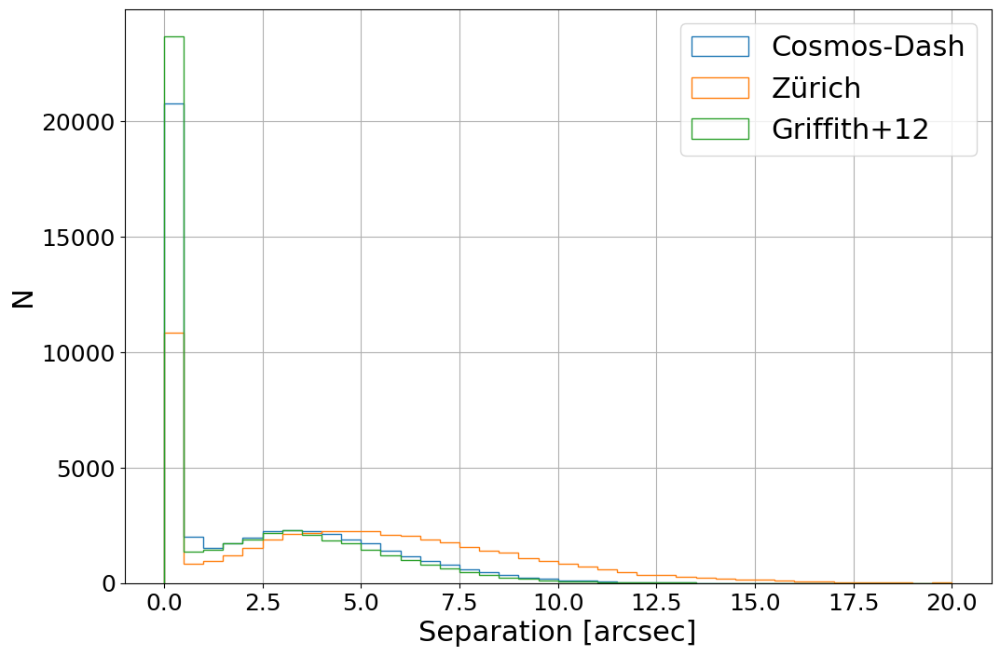

In [140]:
sep_bins = np.linspace(0,20,41)
plt.hist(sep2d_hstW.arcsec, histtype='step', label='Cosmos-Dash', bins=sep_bins)
plt.hist(sep2d_zurW.arcsec, histtype='step', label='Zürich', bins=sep_bins)
plt.hist(sep2d_griW.arcsec, histtype='step', label='Griffith+12', bins=sep_bins)
plt.legend(loc=0)
plt.xlabel('Separation [arcsec]')
plt.ylabel('N')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/separation_with_other_surveys_wide.png', format='png')
plt.show()

In [60]:
df_wide['match_hst'], df_wide['sep_hst'] = idx_hstW, sep2d_hstW.arcsec
df_wide['match_zur'], df_wide['sep_zur'] = idx_zurW, sep2d_zurW.arcsec
df_wide['match_gri'], df_wide['sep_gri'] = idx_griW, sep2d_griW.arcsec

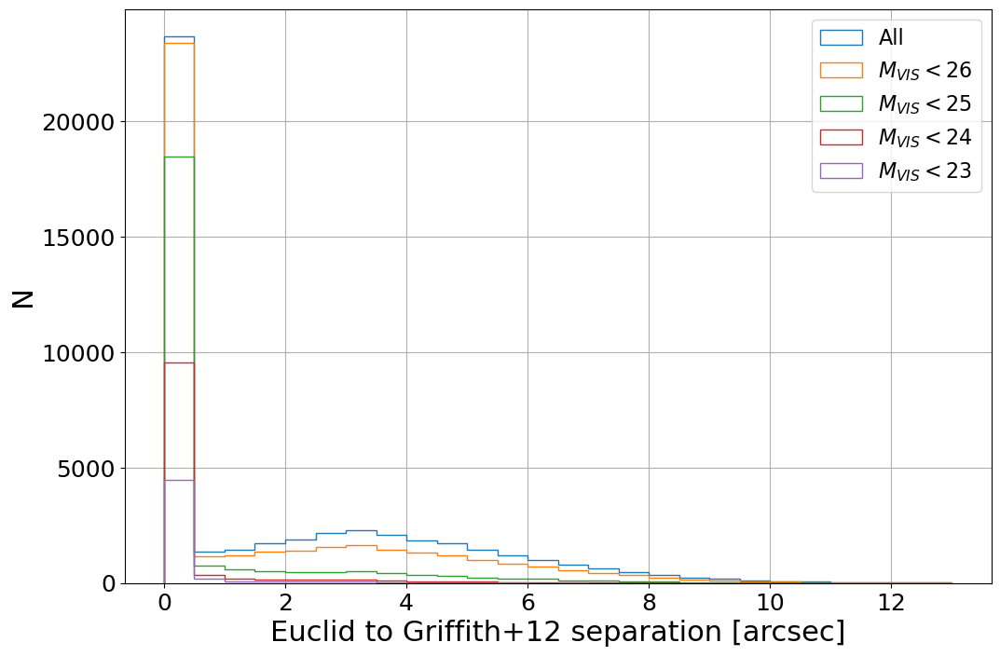

In [61]:
sep_bins = np.linspace(0,13,27)

sep = df_wide.sep_gri
plt.hist(sep, histtype='step', label='All', bins=sep_bins)

for mag_lim in [26,25,24,23]:
    sep = df_wide[df_wide.MAG_VIS_SERSIC < mag_lim].sep_gri
    plt.hist(sep, histtype='step', label='$M_{VIS} < $'+str(mag_lim), bins=sep_bins)


plt.legend(loc=0, fontsize=16)
plt.xlabel('Euclid to Griffith+12 separation [arcsec]')
plt.ylabel('N')
#plt.yscale('log')
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/separation_with_Griffith_mag_effect_wide.png', format='png')
plt.grid()
plt.show()

In [62]:
df_wide = df_wide.merge(df_hst, left_on='match_hst', right_index=True, how='left', suffixes=[None, '_hst'])
df_wide = df_wide.merge(df_zur, left_on='match_zur', right_index=True, how='left', suffixes=[None, '_zur'])
df_wide = df_wide.merge(df_gri, left_on='match_gri', right_index=True, how='left', suffixes=[None, '_gri'])

In [63]:
df_wide.columns.values

array(['OBJECT_ID', 'RIGHT_ASCENSION', 'DECLINATION',
       'SEGMENTATION_MAP_ID', 'VIS_DET', 'FLUX_VIS_APER', 'FLUX_Y_APER',
       'FLUX_J_APER', 'FLUX_H_APER', 'FLUX_NIR_STACK_APER',
       'FLUX_G_EXT_HSC_APER', 'FLUX_Z_EXT_HSC_APER', 'FLUXERR_VIS_APER',
       'FLUXERR_Y_APER', 'FLUXERR_J_APER', 'FLUXERR_H_APER',
       'FLUXERR_NIR_STACK_APER', 'FLUXERR_G_EXT_HSC_APER',
       'FLUXERR_Z_EXT_HSC_APER', 'FLUX_Y_TEMPLFIT', 'FLUX_J_TEMPLFIT',
       'FLUX_H_TEMPLFIT', 'FLUX_G_EXT_HSC_TEMPLFIT',
       'FLUX_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_Y_TEMPLFIT',
       'FLUXERR_J_TEMPLFIT', 'FLUXERR_H_TEMPLFIT',
       'FLUXERR_G_EXT_HSC_TEMPLFIT', 'FLUXERR_Z_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Y_TEMPLFIT', 'FLUX_VIS_TO_J_TEMPLFIT',
       'FLUX_VIS_TO_H_TEMPLFIT', 'FLUX_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUX_VIS_TO_Z_EXT_HSC_TEMPLFIT', 'FLUXERR_VIS_TO_Y_TEMPLFIT',
       'FLUXERR_VIS_TO_J_TEMPLFIT', 'FLUXERR_VIS_TO_H_TEMPLFIT',
       'FLUXERR_VIS_TO_G_EXT_HSC_TEMPLFIT',
       'FLUXERR_V

## Compare results

In [64]:
mag_bins_VIS = np.array([18.,20.,22.,23.,23.5,24.,24.5,25.,25.5,26.,27.,28.,30])
mag_bins_814 = np.array([18,20,21,22,22.5,23,23.5,24,24.5,25,25.5,26])
mag_bins_160 = np.array([17,20,21,21.5,22,22.5,23,23.5,24,24.5])

### vs Griffith+12

In [65]:
df_wide[df_wide.sep_gri < 1].shape[0], df_gri.columns

(25018,
 Index(['ObjNo', 'RAJ2000', 'DEJ2000', 'f1', 'f2', 'z', 'umag', 'gmag', 'rmag',
        'imag', 'Class', 'mu1', 'mu2', 'Sf1', 'Gf1', 's/g1', 's/g2', 'mGal1',
        'e_mGal1', 'mGal2', 'e_mGal2', 'Re.G1', 'e_Re.G1', 'Re.G2', 'e_Re.G2',
        'n.G1', 'e_n.G1', 'n.G2', 'e_n.G2', 'b/a.G1', 'e_b/a.G1', 'b/a.G2',
        'e_b/a.G2', 'pa.G1', 'e_pa.G1', 'pa.G2', 'e_pa.G2'],
       dtype='object'))

(24682, 267)
Median =  0.384
Quantiles: 10% = -0.036  / 25% = 0.167  / 75% = 0.764  / 90% = 1.766


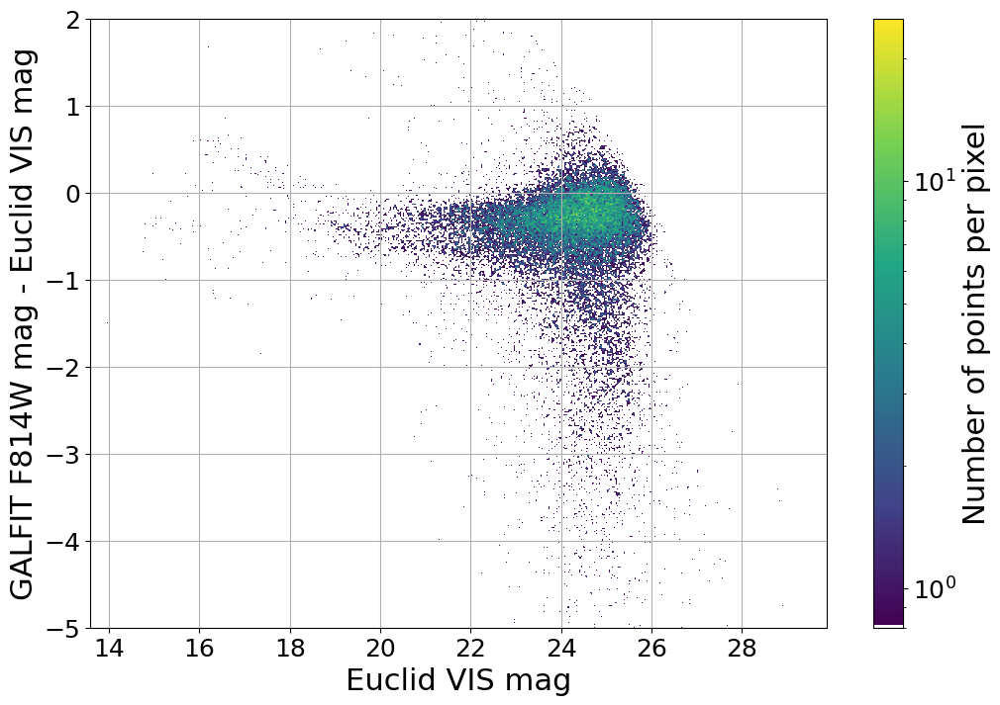

In [66]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1) & (df_wide.e_mGal1 < 3) &
                  (df_wide.MAGERR_VIS_SERSIC < 3) & (df_wide.MAG_VIS_SERSIC > 0)]
print(df_plot.shape)

x, x_err = df_plot['MAG_VIS_SERSIC'].values, df_plot['MAGERR_VIS_SERSIC'].values
y, y_err = df_plot['mGal1'].values, df_plot['e_mGal1'].values

err_y = np.sqrt(x_err*x_err + y_err*y_err)

density = ax.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=25), cmap=white_viridis)

med = np.nanmedian(x-y)
q10 = np.quantile(x-y,0.10)
q25 = np.quantile(x-y,0.25)
q75 = np.quantile(x-y,0.75)
q90 = np.quantile(x-y,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

fig.colorbar(density, label='Number of points per pixel')
plt.xlabel('Euclid VIS mag')
plt.ylabel('GALFIT F814W mag - Euclid VIS mag')
plt.ylim(-5,2)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_photometry_plot_density_wide.png', format='png')
plt.show()

(24682, 267)
Median =  0.384
Quantiles: 10% = -0.036  / 25% = 0.167  / 75% = 0.764  / 90% = 1.766


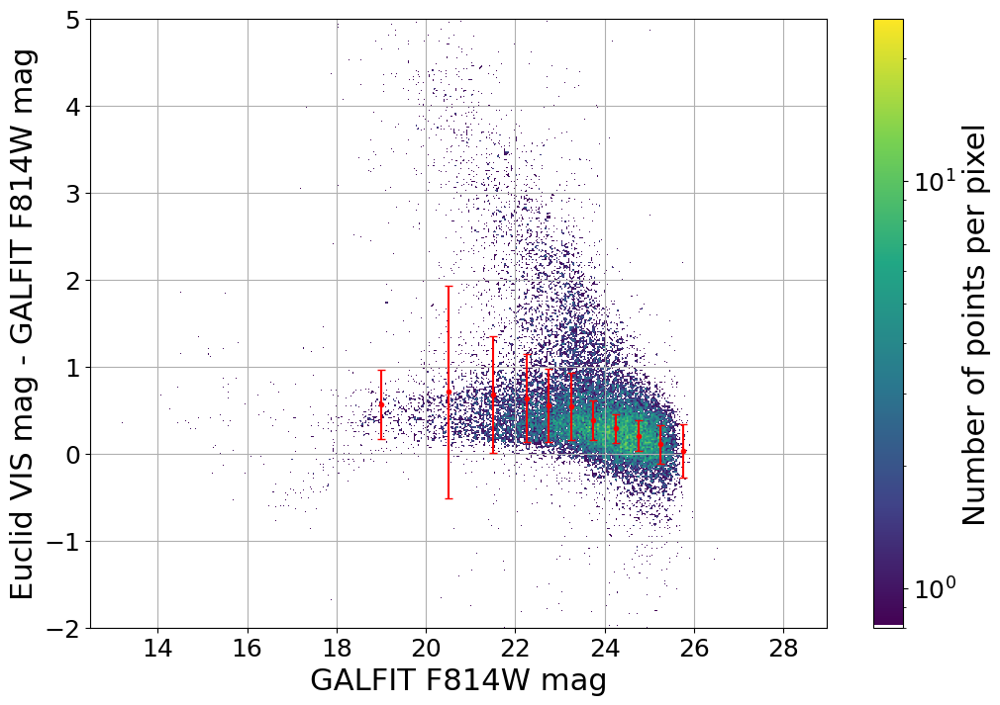

In [134]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1) & (df_wide.e_mGal1 < 3) &
                  (df_wide.MAGERR_VIS_SERSIC < 3) & (df_wide.MAG_VIS_SERSIC > 0)]
print(df_plot.shape)

x, x_err = df_plot['MAG_VIS_SERSIC'].values, df_plot['MAGERR_VIS_SERSIC'].values
y, y_err = df_plot['mGal1'].values, df_plot['e_mGal1'].values

err_y = np.sqrt(x_err*x_err + y_err*y_err)

density = ax.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=0.8, vmax=25), cmap=white_viridis)

med = np.nanmedian(x-y)
q10 = np.quantile(x-y,0.10)
q25 = np.quantile(x-y,0.25)
q75 = np.quantile(x-y,0.75)
q90 = np.quantile(x-y,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['mGal1'].values, df_use['MAG_VIS_SERSIC'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

fig.colorbar(density, label='Number of points per pixel')
plt.xlabel('GALFIT F814W mag')
plt.ylabel('Euclid VIS mag - GALFIT F814W mag')
plt.ylim(16,26)
plt.ylim(-2,5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_photometry_plot_density_bis_wide.png', format='png')
plt.show()

Bias: Overall=0.38 Weighted=0.42
Dispersion : Overall=0.25 Weighted=0.37
Outlier %: Overall=0.17 Weighted=11.69


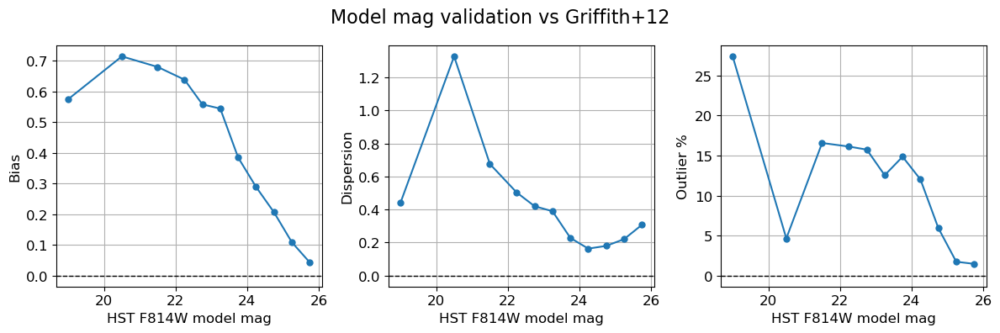

In [68]:
df_plot = df_wide[(df_wide.sep_gri < 1) & (df_wide.MAG_VIS_SERSIC > 0)]

x, y = df_plot['mGal1'].values, df_plot['MAG_VIS_SERSIC'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['mGal1'].values, df_use['MAG_VIS_SERSIC'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Model mag validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_magnitude_vs_Griffith12_wide.png', format='png')
plt.show()

25018
3054


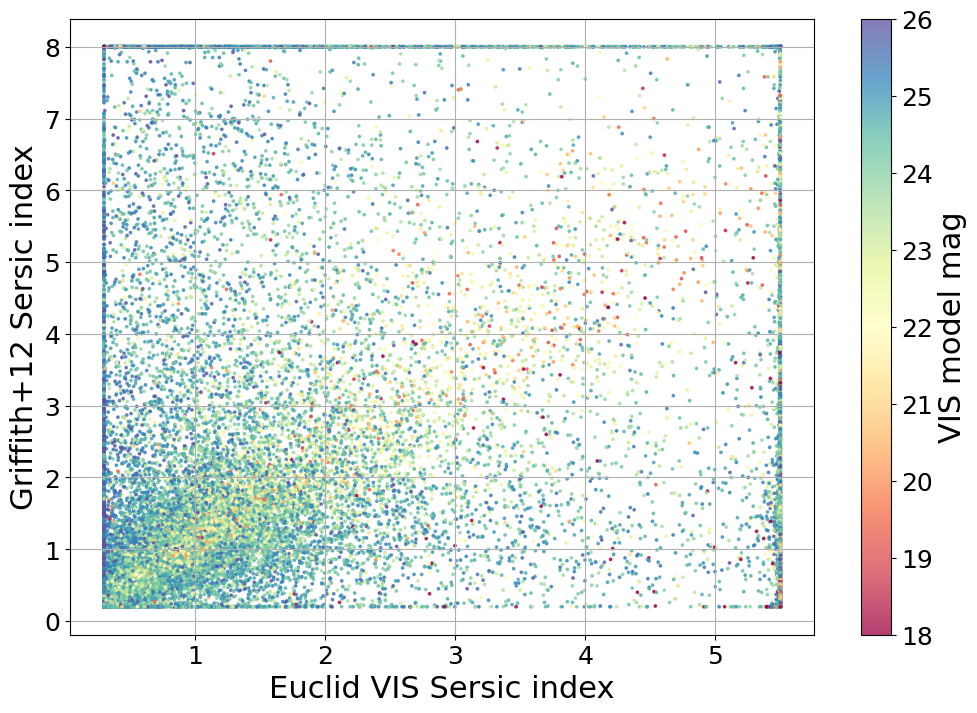

In [69]:
df_plot = df_wide[(df_wide.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n.G1'].values, df_plot['e_n.G1'].values
#z=df_plot['SERSIC_REDUCED_CHI2']
z=df_plot['MAG_VIS_SERSIC']

print(np.sum(x0 > 5.45))
#plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral_r', norm=mpl.colors.LogNorm(vmin=0.1, vmax=100))
plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=26))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
#cbar.set_label(r'SE++ Reduced $\chi_2$')
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid VIS Sersic index')
plt.ylabel('Griffith+12 Sersic index')
#plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Sersic_index_wide.png', format='png')
plt.show()

14297
1976


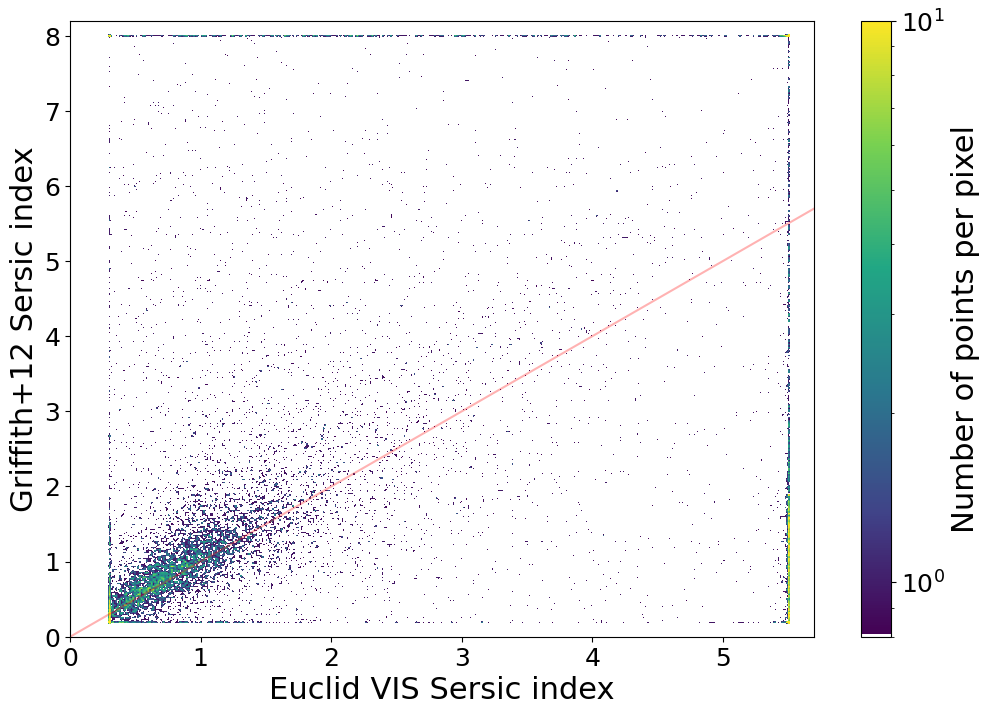

In [70]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1) & (df_wide.MAG_VIS_SERSIC < 24.5)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n.G1'].values, df_plot['e_n.G1'].values

print(np.sum(x0 > 5.45))

density = ax.scatter_density(x0, x1, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)

fig.colorbar(density, label='Number of points per pixel')

xa = np.linspace(0,10,100)
plt.plot(xa,xa,c='r', alpha=0.3)

plt.xlabel('Euclid VIS Sersic index')
plt.ylabel('Griffith+12 Sersic index')
plt.xlim(0,5.7)
plt.ylim(0,8.2)
#plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Sersic_index_cut_mag24.5_wide.png', format='png')
plt.show()

Bias: Overall=-0.19 Weighted=-0.2
Dispersion : Overall=2.22 Weighted=2.27
Outlier %: Overall=0.0 Weighted=1.28


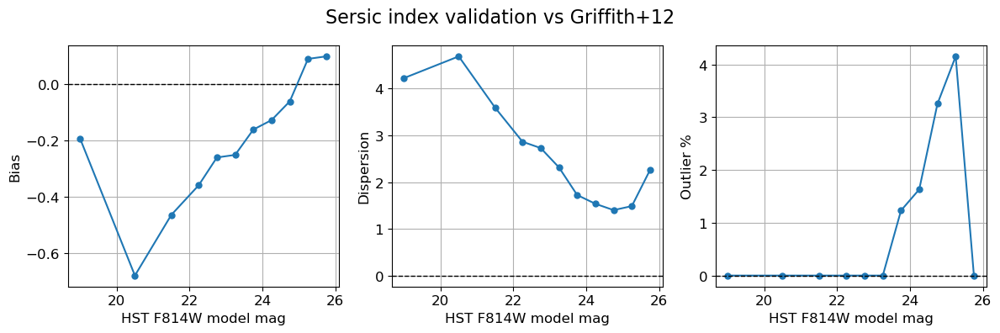

In [71]:
df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = df_plot['n.G1'].values, df_plot['SERSIC_SERSIC_INDEX'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_index_vs_Griffith12_wide.png', format='png')
plt.show()

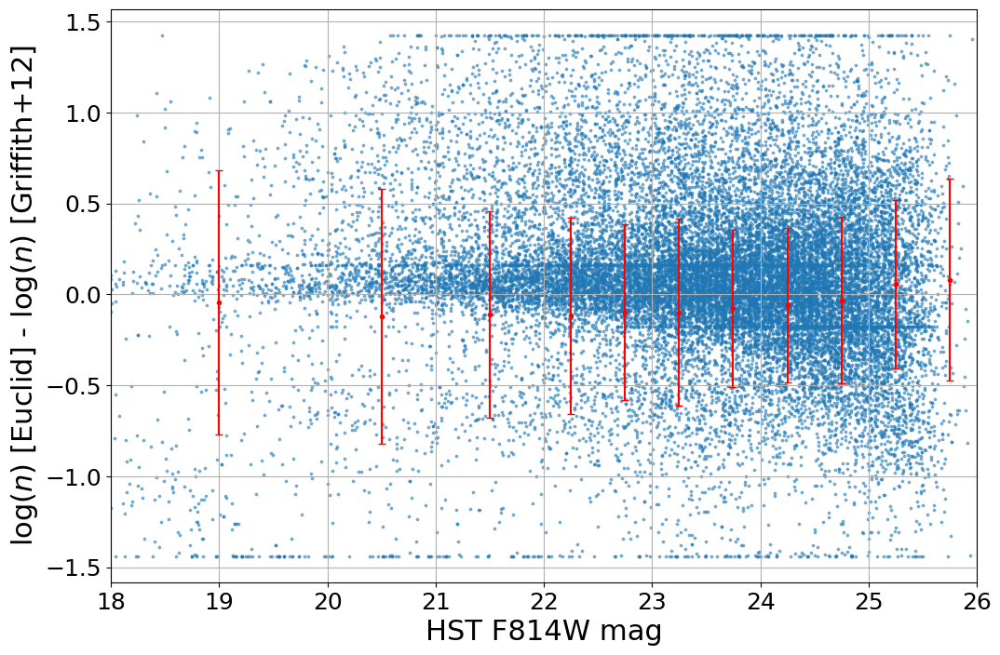

In [72]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1)]

x, xerr = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
y, yerr = df_plot['n.G1'].values, df_plot['e_n.G1'].values

z = df_plot['mGal1'].values

#density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, np.log10(y/x), alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel(r'$\log(n)$ [Euclid] - $\log(n)$ [Griffith+12]')
plt.xlim(18,26)
#plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/log_sersic_index_diff_Griffith12_vs_mag_wide.png', format='png')
plt.show()

Bias: Overall=-0.08 Weighted=-0.06
Dispersion : Overall=0.51 Weighted=0.5
Outlier %: Overall=0.0 Weighted=0.35


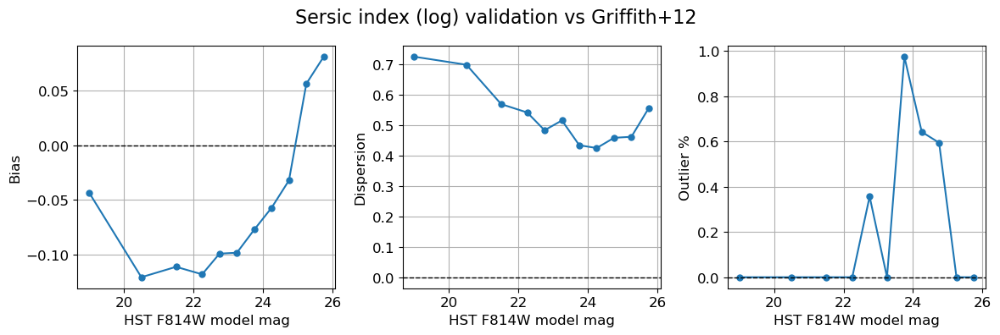

In [73]:
df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = df_plot['n.G1'].values, df_plot['SERSIC_SERSIC_INDEX'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['n.G1'].values, df_use['SERSIC_SERSIC_INDEX'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index (log) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_log_sersic_index_vs_Griffith12_wide.png', format='png')
plt.show()

6968
Median =  1.039
Quantiles: 10% = 0.569  / 25% = 0.884  / 75% = 1.514  / 90% = 5.464


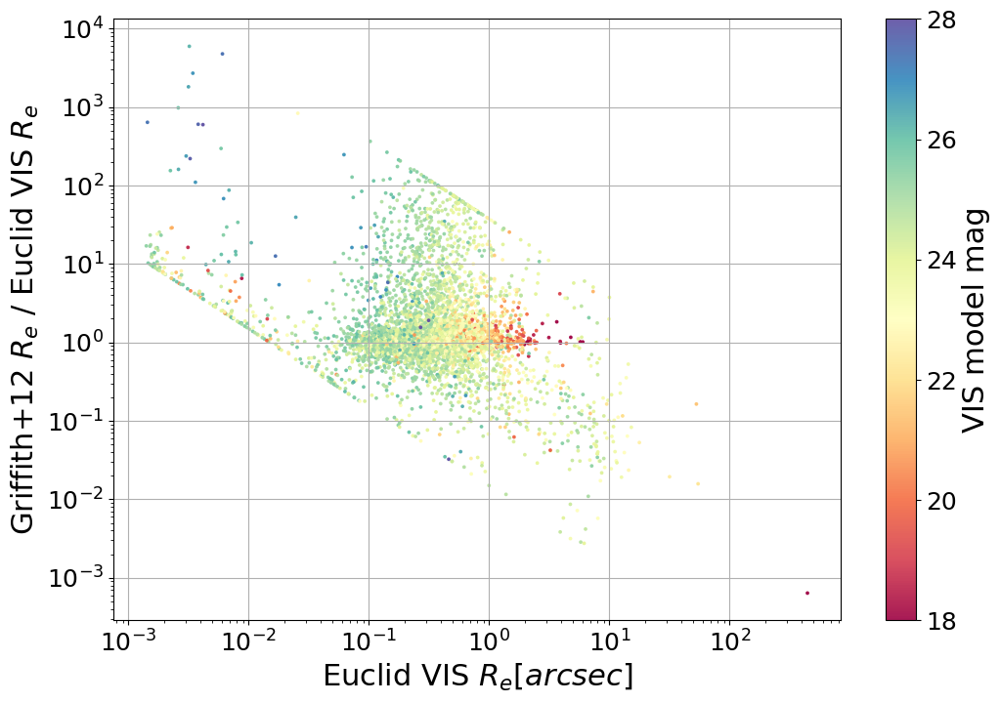

In [131]:
df_plot = df_wide[(df_wide.sep_gri < 1) & (df_wide.re > 0)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_RADIUS'].values, df_plot['SERSIC_SERSIC_RADIUS_ERR'].values
x1, x1err = 0.05*df_plot['Re.G1'].values, 0.05*df_plot['e_Re.G1'].values
z=df_plot['MAG_VIS_SERSIC']

med = np.nanmedian(x1/x0)
q10 = np.quantile(x1/x0,0.10)
q25 = np.quantile(x1/x0,0.25)
q75 = np.quantile(x1/x0,0.75)
q90 = np.quantile(x1/x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1/x0, s=3, alpha=0.9, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid VIS $R_e [arcsec]$')
plt.ylabel('Griffith+12 $R_e$ / Euclid VIS $R_e$')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_Re_wide.png', format='png')
plt.show()

Bias: Overall=-0.03 Weighted=-0.04
Dispersion : Overall=0.31 Weighted=0.39
Outlier %: Overall=0.02 Weighted=3.41


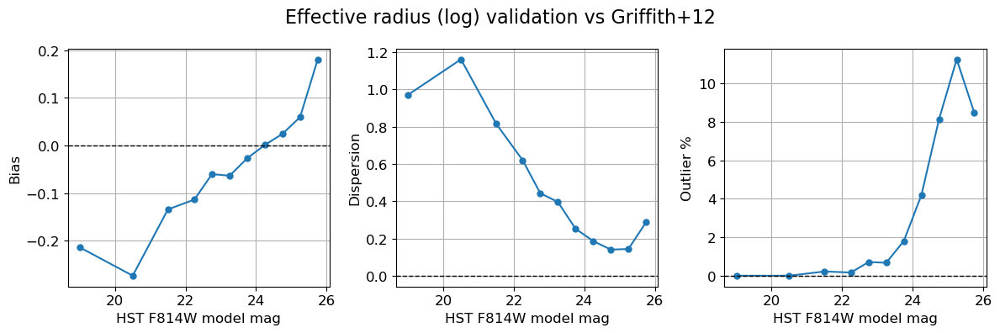

In [133]:
df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (log) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_vs_Griffith12_wide.png', format='png')
plt.show()

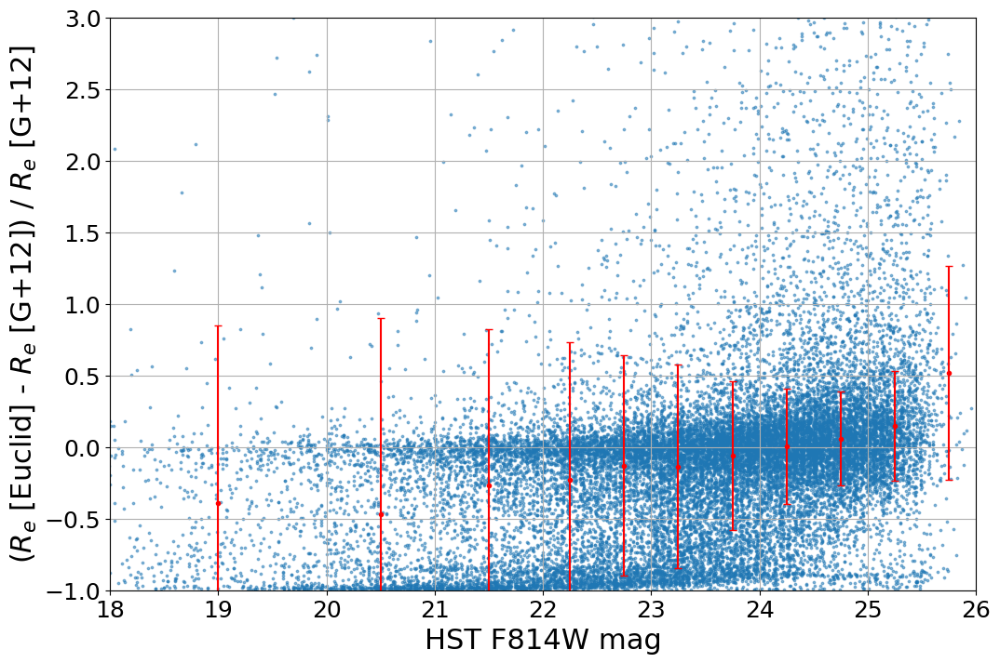

In [76]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

z = df_plot['mGal1'].values

#density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, (y-x)/x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel(r'($R_e$ [Euclid] - $R_e$ [G+12]) / $R_e$ [G+12]')
plt.xlim(18,26)
plt.ylim(-1.0,3.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/re_variation_vs_Griffith12_mag_wide.png', format='png')
plt.show()

Bias: Overall=-0.06 Weighted=-0.08
Dispersion : Overall=0.64 Weighted=0.66
Outlier %: Overall=0.06 Weighted=6.44


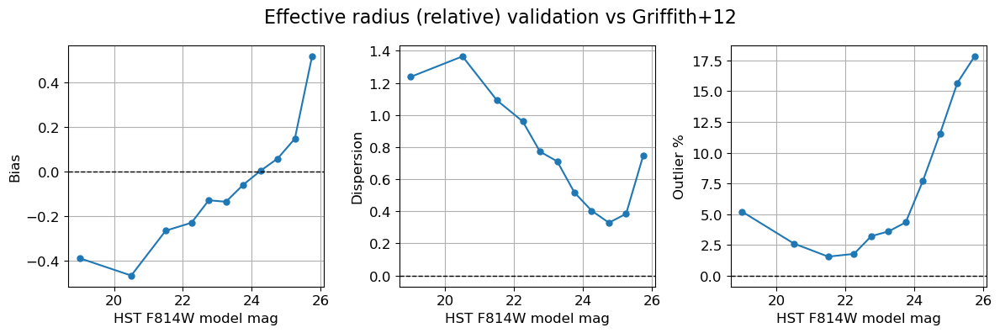

In [77]:
df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = 0.05*df_plot['Re.G1'].values, df_plot['SERSIC_SERSIC_RADIUS'].values 

b = (y-x)/x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = 0.05*df_use['Re.G1'].values, df_use['SERSIC_SERSIC_RADIUS'].values 
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (relative) validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_rel_vs_Griffith12_wide.png', format='png')
plt.show()

25018


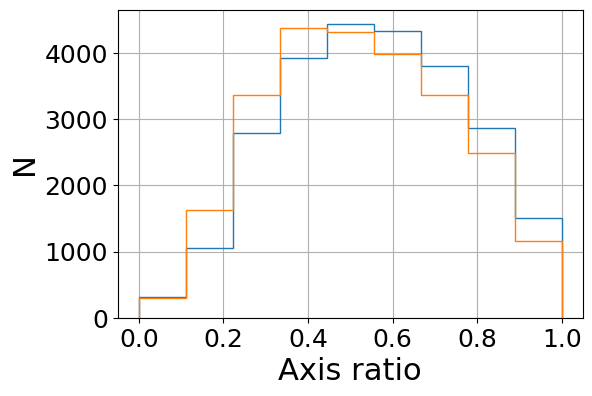

In [78]:
plt.figure(figsize=(6,4))

df_plot = df_wide[(df_wide.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_AXIS_RATIO'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO_ERR'].values
x1, x1err = df_plot['b/a.G1'].values, df_plot['e_b/a.G1'].values

plt.hist(x0, bins = np.linspace(0,1,10), histtype='step', label='Euclid')
plt.hist(x1, bins = np.linspace(0,1,10), histtype='step', label='Griffith+12')

plt.xlabel('Axis ratio')
plt.ylabel('N')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/hist_axis_ratio_vs_Griffith12_wide.png', format='png')
plt.show()

25018
Median =  0.958
Quantiles: 10% = 0.617  / 25% = 0.799  / 75% = 1.087  / 90% = 1.348


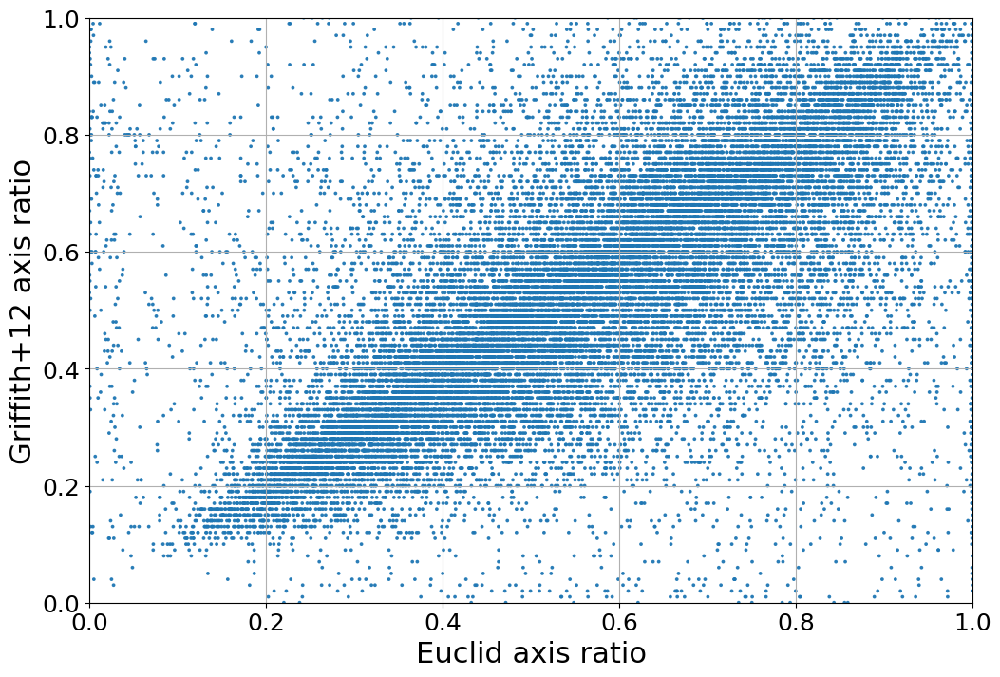

In [119]:
df_plot = df_wide[(df_wide.sep_gri < 1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_AXIS_RATIO'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO_ERR'].values
x1, x1err = df_plot['b/a.G1'].values, df_plot['e_b/a.G1'].values

med = np.nanmedian(x1/x0)
q10 = np.quantile(x1/x0,0.10)
q25 = np.quantile(x1/x0,0.25)
q75 = np.quantile(x1/x0,0.75)
q90 = np.quantile(x1/x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1, s=3, alpha=0.9, ls='')
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

plt.xlabel('Euclid axis ratio')
plt.ylabel('Griffith+12 axis ratio')
#plt.xscale('log')
#plt.yscale('log')
plt.xlim(0,1)
plt.ylim(0,1)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_Griffith12_axis_ratio_wide.png', format='png')
plt.show()

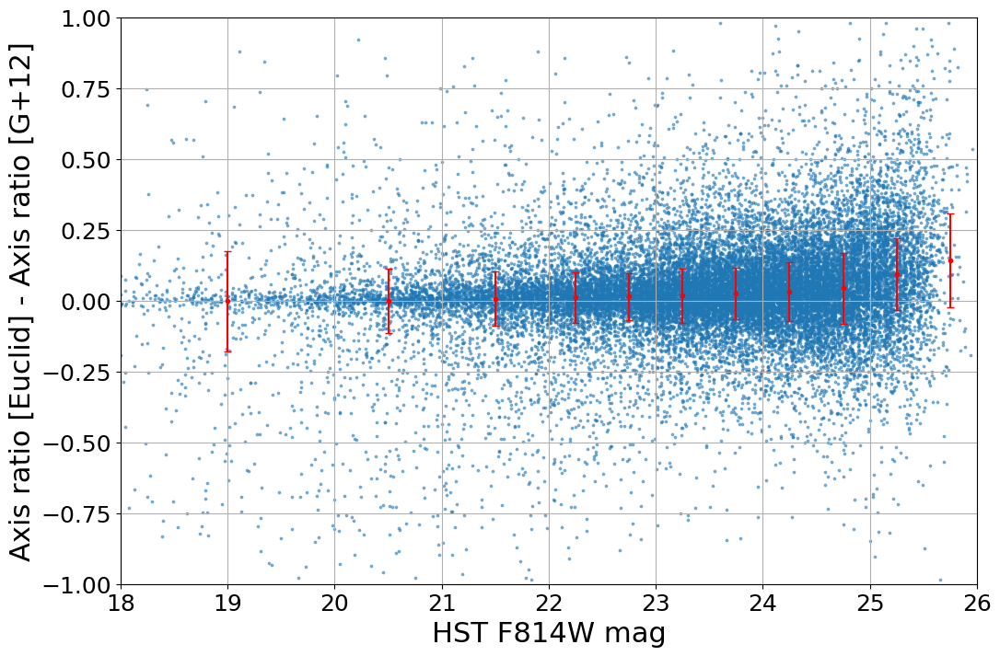

In [80]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = df_plot['b/a.G1'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values

z = df_plot['mGal1'].values

#density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, y-x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_814)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['b/a.G1'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F814W mag')
plt.ylabel('Axis ratio [Euclid] - Axis ratio [G+12]')
plt.xlim(18,26)
plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/axis_ratio_variation_vs_Griffith12_mag_wide.png', format='png')
plt.show()

Bias: Overall=0.02 Weighted=0.03
Dispersion : Overall=0.12 Weighted=0.11
Outlier %: Overall=0.04 Weighted=4.19


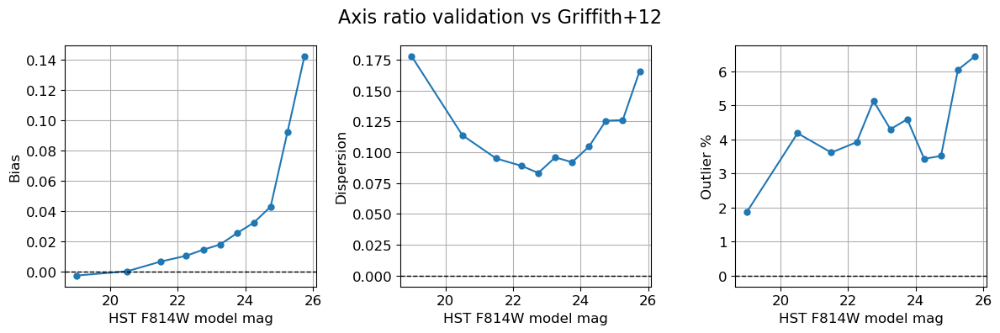

In [81]:
df_plot = df_wide[(df_wide.sep_gri < 1)]

x, y = df_plot['b/a.G1'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values 

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_814)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_814[k], mag_bins_814[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['b/a.G1'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_814[1:] + mag_bins_814[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F814W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Axis ratio validation vs Griffith+12', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_axis-ratio_vs_Griffith12_wide.png', format='png')
plt.show()

### vs CosmosDash catalog

In [82]:
df_hst.columns

Index(['ID', 'RA', 'DEC', 'flag', 'use', 'mag', 'dmag', 're', 'dre', 'n', 'dn',
       'q', 'dq', 'pa', 'dpa', 'kron', 'f_F160W_auto', 'e_F160W_auto',
       'f_F160W_tot', 'e_F160W_tot', 'snr', 'flag_limit_r', 'flag_limit_n',
       'flag_deb', 'Mcorr', '5_sigma_depth', 'chi', 'chi_nu', 'mag_F160W_auto',
       'mag_err_F160W_auto', 'mag_F160W_tot', 'mag_err_F160W_tot'],
      dtype='object')

3611
Median =  0.094
Quantiles: 10% = -0.194  / 25% = -0.027  / 75% = 0.244  / 90% = 0.671
Median =  -0.113
Quantiles: 10% = -0.699  / 25% = -0.397  / 75% = 0.085  / 90% = 0.281


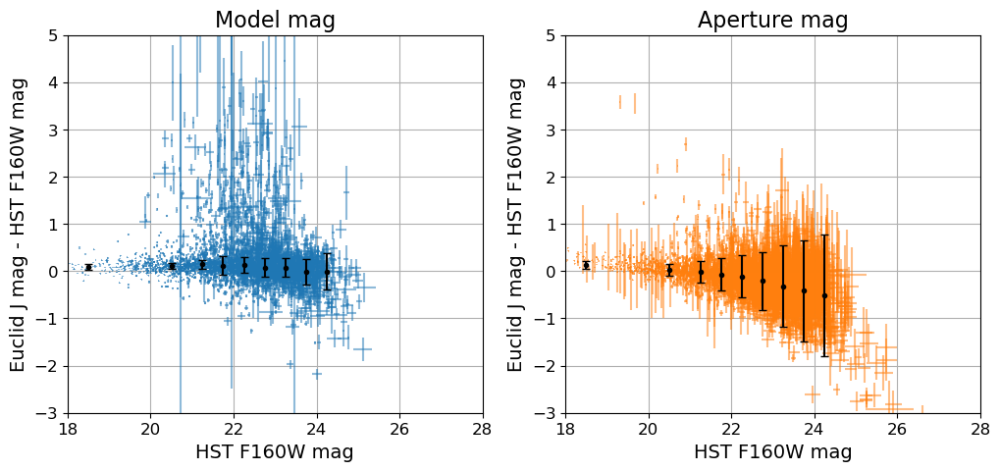

In [130]:
fig, axs = plt.subplots(1, 2, sharex=True, figsize=(12,5))

df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.mag > -99) & (df_wide.use==1) &
             (df_wide.MAGERR_J_APER > 0) & (df_wide.MAGERR_J_APER < 1) & (df_wide.MAGERR_J_SERSIC> 0)]
print(df_plot.shape[0])

x0, x0_err = df_plot['MAG_J_SERSIC'].values, df_plot['MAGERR_J_SERSIC'].values
y0, y0_err = df_plot['mag'].values, df_plot['dmag'].values

x1, x1_err = df_plot['MAG_J_APER'].values, df_plot['MAGERR_J_APER'].values
y1, y1_err = df_plot['mag_F160W_auto'].values, df_plot['mag_err_F160W_auto'].values
y2, y2_err = df_plot['mag_F160W_tot'].values, df_plot['mag_err_F160W_tot'].values

err_y0 = np.sqrt(x0_err*x0_err + y0_err*y0_err)
err_y1 = np.sqrt(x1_err*x1_err + y1_err*y1_err)
err_y2 = np.sqrt(x1_err*x1_err + y2_err*y2_err)

axs[0].errorbar(y0, x0-y0, xerr=y0_err, yerr=err_y0, markersize=2, alpha=0.5, ls='')
axs[1].errorbar(y2, x1-y2, xerr=y2_err, yerr=err_y2, markersize=2, alpha=0.5, ls='', c='tab:orange')
#axs[0].scatter(y0, x0-y0, s=2, alpha=0.5, ls='')
#axs[1].scatter(y2, x1-y2, s=2, alpha=0.5, c='tab:orange')

med = np.nanmedian(x0-y0)
q10 = np.quantile(x0-y0,0.10)
q25 = np.quantile(x0-y0,0.25)
q75 = np.quantile(x0-y0,0.75)
q90 = np.quantile(x0-y0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[0].set_title('Model mag', fontsize = 16)

med = np.nanmedian(x1-y2)
q10 = np.quantile(x1-y2,0.10)
q25 = np.quantile(x1-y2,0.25)
q75 = np.quantile(x1-y2,0.75)
q90 = np.quantile(x1-y2,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[1].set_title('Aperture mag', fontsize = 16)

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
B2, D2 = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x0, y0 = df_use['mag'].values, df_use['MAG_J_SERSIC'].values 
        b0 = y0-x0
        B[k] = np.median(b0)
        D[k] = np.quantile(np.abs(b0)-B[k], 0.68)
    df_use_bis = df_plot[(df_plot.mag_F160W_tot >= m1) & (df_plot.mag_F160W_tot < m2)]
    if df_use_bis.shape[0] > 10 :
        x2, y2 = df_use_bis['mag_F160W_tot'].values, df_use_bis['MAG_J_APER'].values 
        b2 = y2-x2
        B2[k] = np.median(b2)
        D2[k] = np.quantile(np.abs(b2)-B2[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
axs[0].errorbar(X, B, yerr=D, markersize=3, color='k', capsize=3, fmt='o')
axs[1].errorbar(X, B2, yerr=D2, markersize=3, color='k', capsize=3, fmt='o')


for ax in axs.flat:
    ax.set_xlabel('HST F160W mag', fontsize = 14)
    ax.set_ylabel('Euclid J mag - HST F160W mag', fontsize = 14)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.set(xlim=(18,28))
    ax.set(ylim=(-3,5))

plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_J_CosmosDash_photometry_deep.png', format='png')
plt.show()

Model
Bias: Overall=0.1 Weighted=0.09
Dispersion : Overall=0.17 Weighted=0.18
Outlier %: Overall=0.12 Weighted=12.35
Aperture
Bias: Overall=-0.1 Weighted=-0.15
Dispersion : Overall=0.52 Weighted=0.57
Outlier %: Overall=0.02 Weighted=2.32


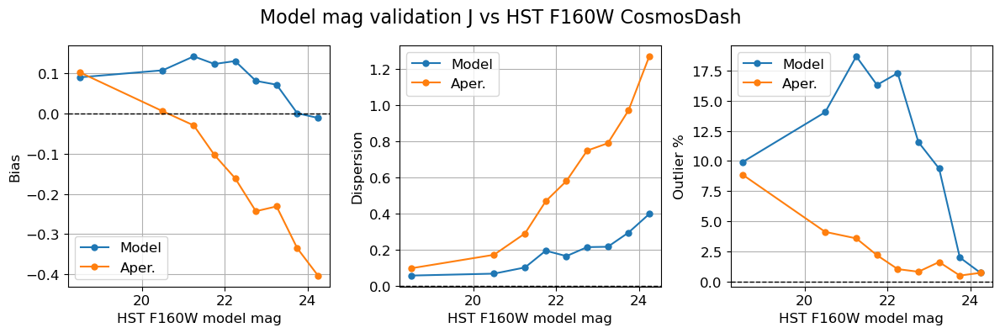

In [84]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.mag > -99) & (df_wide.use==1) &
                  (df_wide.MAGERR_J_APER > 0) & (df_wide.MAGERR_J_SERSIC> 0)]

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

for i in range(2):
    if i==0:
        x, y = df_plot['mag'].values, df_plot['MAG_J_SERSIC'].values 
        c='tab:blue'
        lab='Model'
    else:
        x, y = df_plot['mag_F160W_tot'].values, df_plot['MAG_J_APER'].values
        c='tab:orange'
        lab='Aper.'

    b = y-x
    med = np.median(b)
    disp = np.quantile(np.abs(b)-med, 0.68)
    outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

    nb = len(mag_bins_160)-1
    B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
    for k in range(nb):
        m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
        df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
        if df_use.shape[0] > 10 :
            if i==0:
                x, y = df_use['mag'].values, df_use['MAG_J_SERSIC'].values, 
            else:
                x, y = df_use['mag_F160W_tot'].values, df_use['MAG_J_APER'].values
            b = y-x
            B[k] = np.median(b)
            D[k] = np.quantile(np.abs(b)-B[k], 0.68)
            O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
        weight[k] = df_use.shape[0] / df_plot.shape[0]

    X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

    okB = np.isfinite(B)
    wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
    okD = np.isfinite(D)
    wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
    okO = np.isfinite(O)
    wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

    axs[0].plot(X, B, marker = 'o', markersize=5, c=c, label=lab)
    axs[1].plot(X, D, marker = 'o', markersize=5, c=c, label=lab)
    axs[2].plot(X, O, marker = 'o', markersize=5, c=c, label=lab)
    
    if i==0:
        print('Model')
    else:
        print('Aperture')
    print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
    print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
    print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

    axs[0].set_ylabel('Bias', fontsize = 12)
    axs[1].set_ylabel('Dispersion', fontsize = 12)
    axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.legend(fontsize = 12)

fig.suptitle('Model mag validation J vs HST F160W CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_mag_J_vs_CosmosDash_wide.png', format='png')
plt.show()

3750
Median =  0.183
Quantiles: 10% = -0.405  / 25% = 0.019  / 75% = 0.299  / 90% = 0.472
Median =  0.183
Quantiles: 10% = -0.405  / 25% = 0.019  / 75% = 0.299  / 90% = 0.472


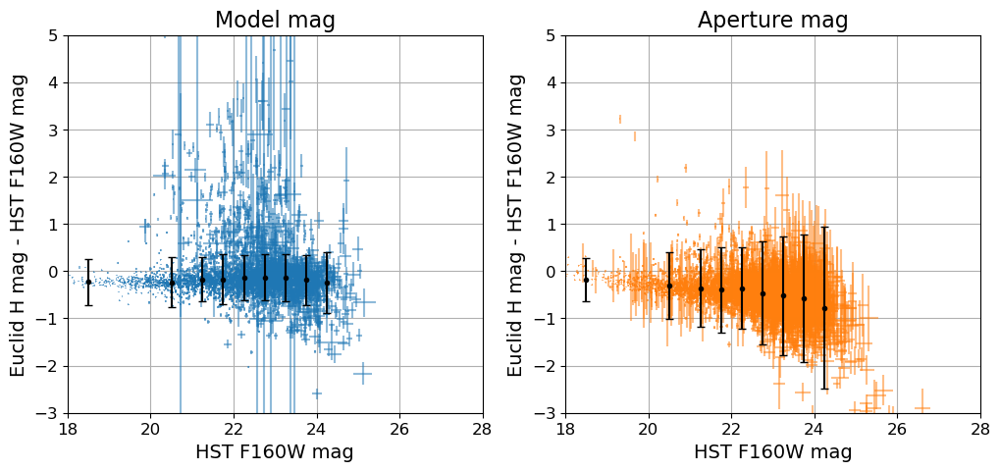

In [127]:
fig, axs = plt.subplots(1, 2, sharex=True, figsize=(12,5))

df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.mag > -99) & (df_wide.use==1) &
                  (df_wide.MAGERR_H_APER < 1) & (df_wide.MAGERR_H_APER > 0) & (df_wide.MAGERR_H_SERSIC> 0)]
print(df_plot.shape[0])

x0, x0_err = df_plot['MAG_H_SERSIC'].values, df_plot['MAGERR_H_SERSIC'].values
y0, y0_err = df_plot['mag'].values, df_plot['dmag'].values

x1, x1_err = df_plot['MAG_H_APER'].values, df_plot['MAGERR_H_APER'].values
y1, y1_err = df_plot['mag_F160W_auto'].values, df_plot['mag_err_F160W_auto'].values
y2, y2_err = df_plot['mag_F160W_tot'].values, df_plot['mag_err_F160W_tot'].values

err_y0 = np.sqrt(x0_err*x0_err + y0_err*y0_err)
err_y1 = np.sqrt(x1_err*x1_err + y1_err*y1_err)
err_y2 = np.sqrt(x1_err*x1_err + y2_err*y2_err)

axs[0].errorbar(y0, x0-y0, xerr=y0_err, yerr=err_y0, markersize=2, alpha=0.5, ls='')
axs[1].errorbar(y2, x1-y2, xerr=y2_err, yerr=err_y2, markersize=2, alpha=0.5, ls='', c='tab:orange')

med = np.nanmedian(y0-x0)
q10 = np.quantile(y0-x0,0.10)
q25 = np.quantile(y0-x0,0.25)
q75 = np.quantile(y0-x0,0.75)
q90 = np.quantile(y0-x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[0].set_title('Model mag', fontsize = 16)

med = np.nanmedian(y0-x0)
q10 = np.quantile(y0-x0,0.10)
q25 = np.quantile(y0-x0,0.25)
q75 = np.quantile(y0-x0,0.75)
q90 = np.quantile(y0-x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

axs[1].set_title('Aperture mag', fontsize = 16)

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
B2, D2 = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x0, y0 = df_use['mag'].values, df_use['MAG_H_SERSIC'].values 
        b0 = y0-x0
        B[k] = np.median(b0)
        D[k] = np.quantile(np.abs(b0)-B[k], 0.68)
    df_use_bis = df_plot[(df_plot.mag_F160W_tot >= m1) & (df_plot.mag_F160W_tot < m2)]
    if df_use_bis.shape[0] > 10 :
        x2, y2 = df_use_bis['mag_F160W_tot'].values, df_use_bis['MAG_H_APER'].values 
        b2 = y2-x2
        B2[k] = np.median(b2)
        D2[k] = np.quantile(np.abs(b2)-B2[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
axs[0].errorbar(X, B, yerr=D, markersize=3, color='k', capsize=3, fmt='o')
axs[1].errorbar(X, B2, yerr=D2, markersize=3, color='k', capsize=3, fmt='o')

for ax in axs.flat:
    ax.set_xlabel('HST F160W mag', fontsize = 14)
    ax.set_ylabel('Euclid H mag - HST F160W mag', fontsize = 14)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.set(xlim=(18,28))
    ax.set(ylim=(-3,5))

plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_H_CosmosDash_photometry_deep.png', format='png')
plt.show()

Model
Bias: Overall=-0.18 Weighted=-0.17
Dispersion : Overall=0.51 Weighted=0.5
Outlier %: Overall=0.04 Weighted=4.07
Aperture
Bias: Overall=-0.4 Weighted=-0.43
Dispersion : Overall=1.0 Weighted=1.03
Outlier %: Overall=0.0 Weighted=0.56


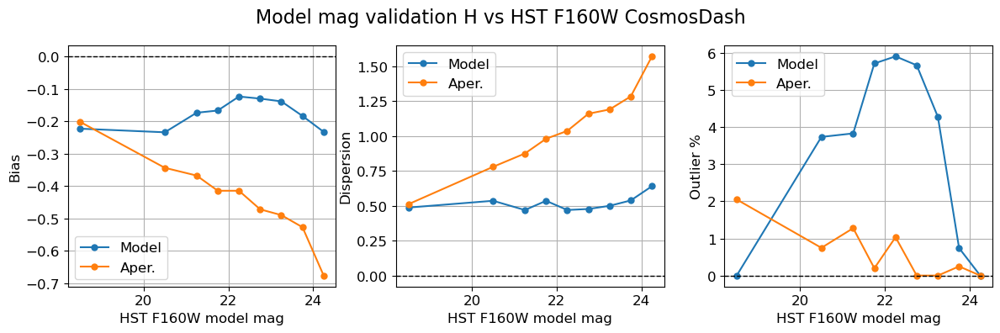

In [86]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.mag > -99) & (df_wide.use==1) &
                  (df_wide.MAGERR_H_APER > 0) & (df_wide.MAGERR_H_SERSIC> 0)]

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

for i in range(2):
    if i==0:
        x, y = df_plot['mag'].values, df_plot['MAG_H_SERSIC'].values 
        c='tab:blue'
        lab='Model'
    else:
        x, y = df_plot['mag_F160W_tot'].values, df_plot['MAG_H_APER'].values
        c='tab:orange'
        lab='Aper.'

    b = y-x
    med = np.median(b)
    disp = np.quantile(np.abs(b)-med, 0.68)
    outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

    nb = len(mag_bins_160)-1
    B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
    for k in range(nb):
        m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
        df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
        if df_use.shape[0] > 10 :
            if i==0:
                x, y = df_use['mag'].values, df_use['MAG_H_SERSIC'].values, 
            else:
                x, y = df_use['mag_F160W_tot'].values, df_use['MAG_H_APER'].values
            b = y-x
            B[k] = np.median(b)
            D[k] = np.quantile(np.abs(b)-B[k], 0.68)
            O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
        weight[k] = df_use.shape[0] / df_plot.shape[0]

    X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

    okB = np.isfinite(B)
    wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
    okD = np.isfinite(D)
    wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
    okO = np.isfinite(O)
    wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

    axs[0].plot(X, B, marker = 'o', markersize=5, c=c, label=lab)
    axs[1].plot(X, D, marker = 'o', markersize=5, c=c, label=lab)
    axs[2].plot(X, O, marker = 'o', markersize=5, c=c, label=lab)
    
    if i==0:
        print('Model')
    else:
        print('Aperture')
    print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
    print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
    print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

    axs[0].set_ylabel('Bias', fontsize = 12)
    axs[1].set_ylabel('Dispersion', fontsize = 12)
    axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()
    ax.legend(fontsize = 12)

fig.suptitle('Model mag validation H vs HST F160W CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_mag_H_vs_CosmosDash_wide.png', format='png')
plt.show()

4357


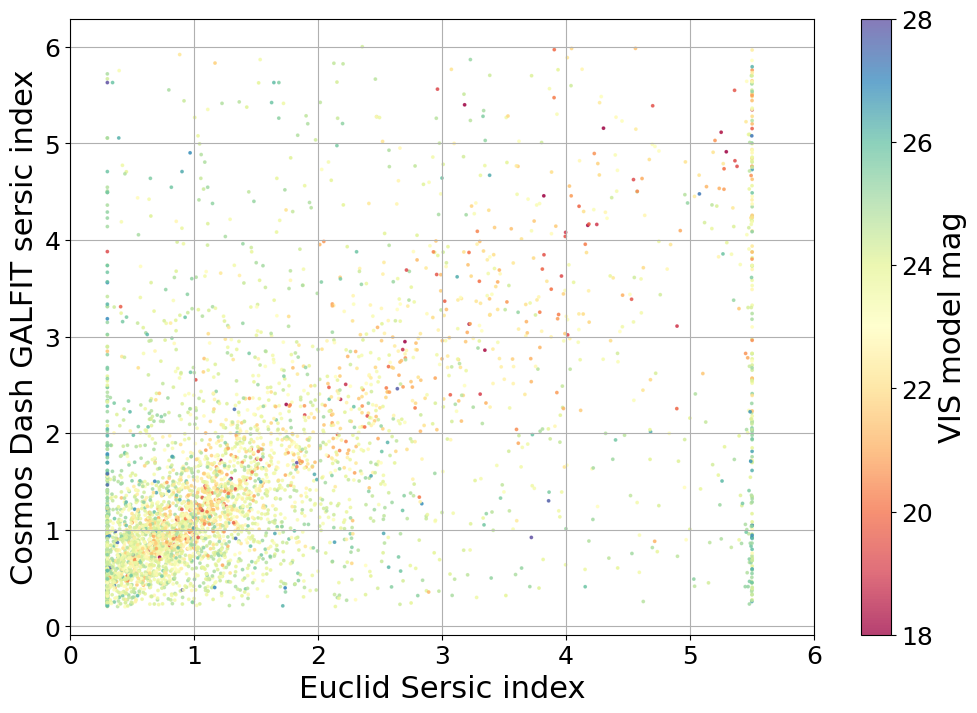

In [87]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.use==1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['SERSIC_SERSIC_INDEX_ERR'].values
x1, x1err = df_plot['n'].values, df_plot['dn'].values
#z=df_plot['SERSIC_REDUCED_CHI2']
z=df_plot['MAG_VIS_SERSIC']

#plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral_r', norm=mpl.colors.LogNorm(vmin=0.1, vmax=100))
plt.scatter(x0, x1, s=3, alpha=0.75, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
#cbar.set_label(r'SE++ Reduced $\chi_2$')
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid Sersic index')
plt.ylabel('Cosmos Dash GALFIT sersic index')
plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_CosmosDash_Sersic_index_wide.png', format='png')
plt.show()

Bias: Overall=0.12 Weighted=0.11
Dispersion : Overall=0.6 Weighted=0.57
Outlier %: Overall=0.05 Weighted=5.26


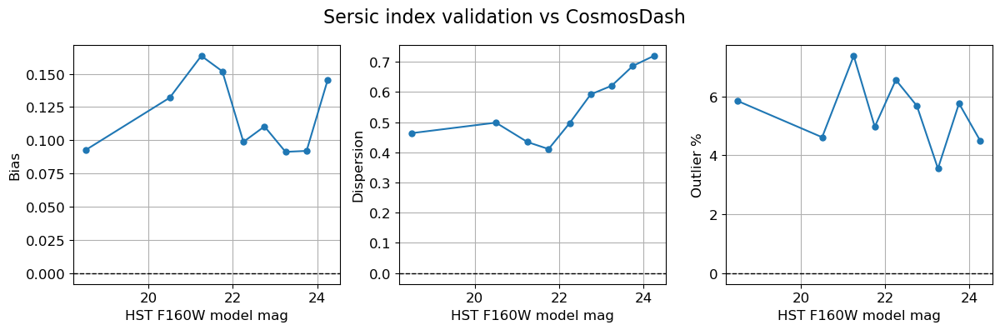

In [88]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.use==1)]

x, y = df_plot['SERSIC_SERSIC_INDEX'].values, df_plot['n'].values

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['SERSIC_SERSIC_INDEX'].values, df_use['n'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Sersic index validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_index_vs_CosmosDash_wide.png', format='png')
plt.show()

4357
Median =  0.900
Quantiles: 10% = 0.590  / 25% = 0.776  / 75% = 1.026  / 90% = 1.356


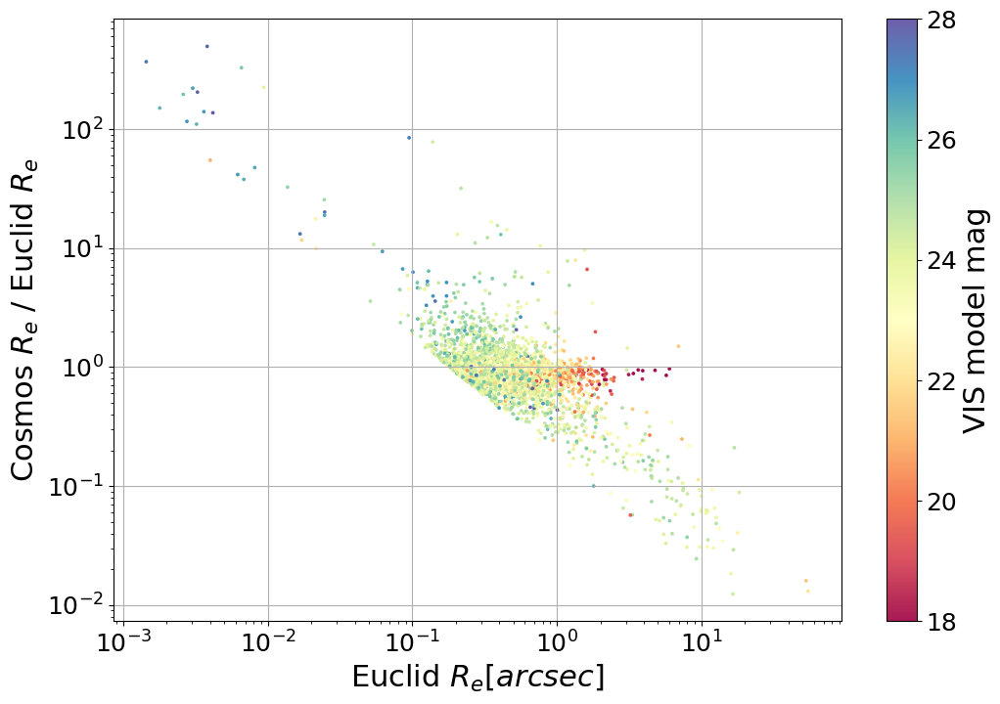

In [89]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.re > 0) & (df_wide.use==1)]
print(df_plot.shape[0])

x0, x0err = df_plot['SERSIC_SERSIC_RADIUS'].values, df_plot['SERSIC_SERSIC_RADIUS_ERR'].values
x1, x1err = df_plot['re'].values, df_plot['dre'].values
z=df_plot['MAG_VIS_SERSIC']

med = np.nanmedian(x1/x0)
q10 = np.quantile(x1/x0,0.10)
q25 = np.quantile(x1/x0,0.25)
q75 = np.quantile(x1/x0,0.75)
q90 = np.quantile(x1/x0,0.90)
print('Median = ', '%1.3f' %med)
print('Quantiles:', '10% =', '%1.3f' %q10, ' / 25% =','%1.3f' %q25, ' / 75% =','%1.3f' %q75, ' / 90% =','%1.3f' %q90)

plt.scatter(x0, x1/x0, s=3, alpha=0.9, ls='', c=z, cmap='Spectral', norm=mpl.colors.Normalize(vmin=18, vmax=28))
#plt.errorbar(x0, x1, xerr=x0err, yerr=x1err, markersize=2, alpha=0.5, ls='')

cbar = plt.colorbar()
cbar.set_label(r'VIS model mag')

plt.xlabel('Euclid $R_e [arcsec]$')
plt.ylabel('Cosmos $R_e$ / Euclid $R_e$')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0,6)
#plt.ylim(0,6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/compare_CosmosDash_Re_wide.png', format='png')
plt.show()

Bias: Overall=-0.05 Weighted=-0.04
Dispersion : Overall=0.17 Weighted=0.16
Outlier %: Overall=0.03 Weighted=2.43


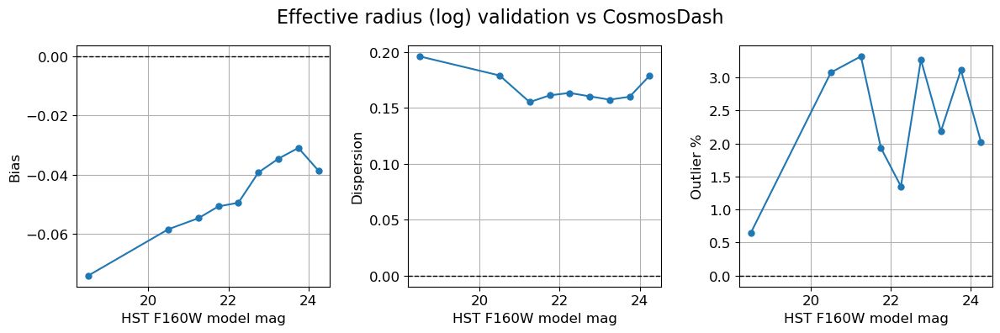

In [90]:
df_plot = df_wide[(df_wide.sep_hst < 1) & (df_wide.re > 0) & (df_wide.use==1)]

x, y = df_plot['SERSIC_SERSIC_RADIUS'].values, df_plot['re'].values

b = np.log10(y/x)
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]



nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mGal1 >= m1) & (df_plot.mGal1 < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['SERSIC_SERSIC_RADIUS'].values, df_use['re'].values
        b = np.log10(y/x)
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (log) validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_vs_CosmosDash_wide.png', format='png')
plt.show()

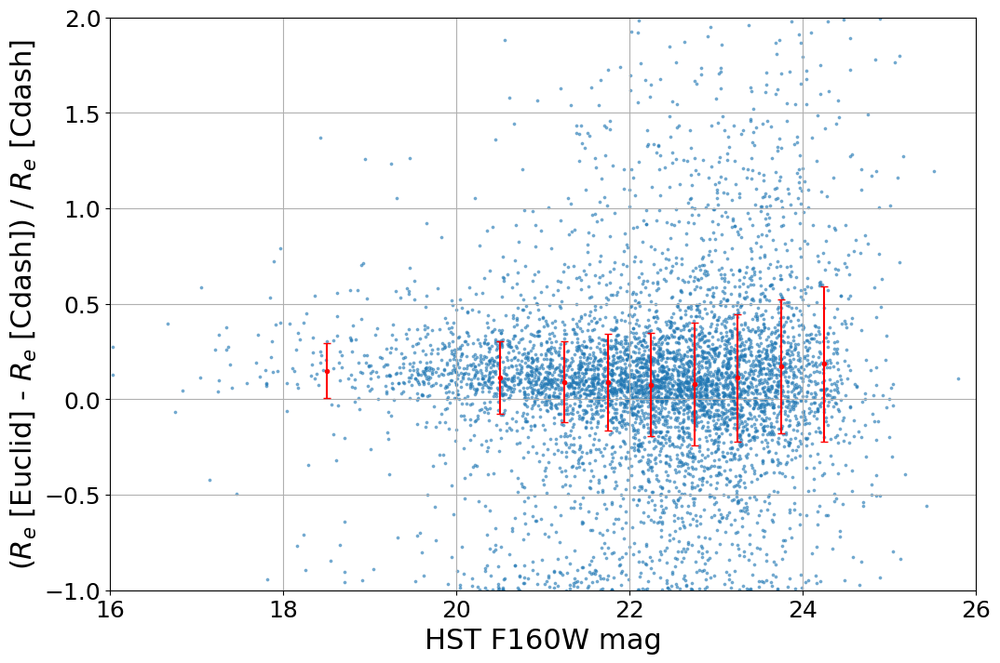

In [91]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_hst < 1)]

x, y = df_plot['re'].values, df_plot['SERSIC_SERSIC_RADIUS'].values

z = df_plot['mag'].values

#density = ax.scatter_density(z, np.log10(y/x), norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, (y-x)/x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['re'].values, df_use['SERSIC_SERSIC_RADIUS'].values
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F160W mag')
plt.ylabel(r'($R_e$ [Euclid] - $R_e$ [Cdash]) / $R_e$ [Cdash]')
plt.xlim(16,26)
plt.ylim(-1.0,2.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_variation_CosmosDash_vs_mag_wide.png', format='png')
plt.show()

Bias: Overall=-1.0 Weighted=0.11
Dispersion : Overall=2.01 Weighted=0.28
Outlier %: Overall=0.01 Weighted=9.7


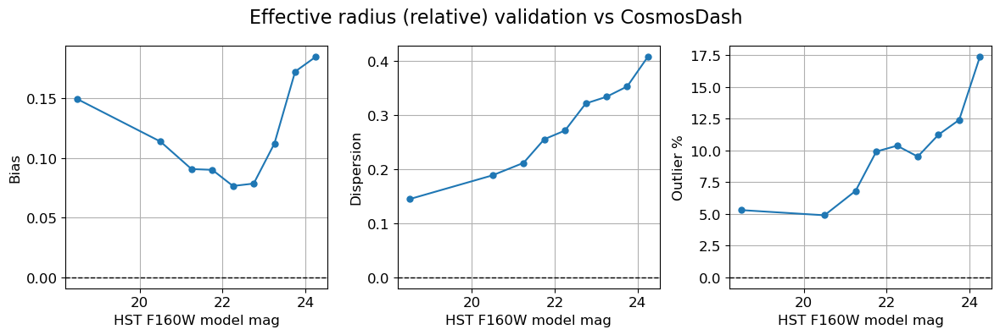

In [92]:
df_plot = df_wide[(df_wide.sep_hst < 1)]

x, y = df_plot['re'].values, df_plot['SERSIC_SERSIC_RADIUS'].values 

b = (y-x)/x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['re'].values, df_use['SERSIC_SERSIC_RADIUS'].values 
        b = (y-x)/x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Effective radius (relative) validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_sersic_Re_rel_vs_CosmosDash_wide.png', format='png')
plt.show()

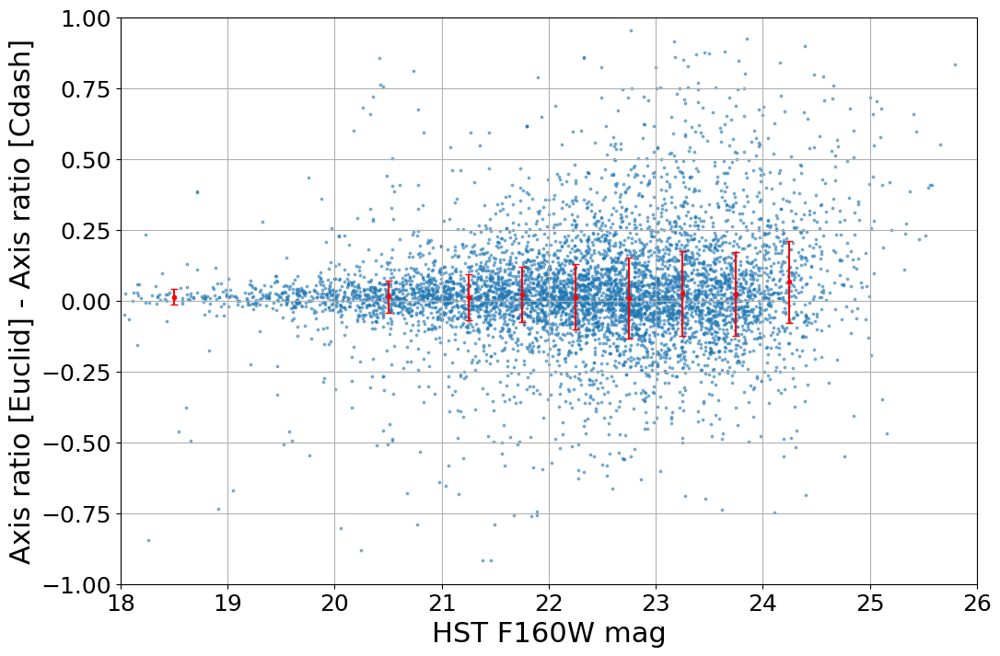

In [93]:
fig = plt.figure()
#ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

df_plot = df_wide[(df_wide.sep_hst < 1)]

x, y = df_plot['q'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values

z = df_plot['mag'].values

#density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=0.8, vmax=10), cmap=white_viridis)
plt.scatter(z, y-x, alpha=0.5, s=3)

#fig.colorbar(density, label='Number of points per pixel')

nb = len(mag_bins_160)-1
B, D = np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['q'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])
plt.errorbar(X, B, yerr=D, markersize=3, color='r', capsize=3, fmt='o')

plt.xlabel('HST F160W mag')
plt.ylabel('Axis ratio [Euclid] - Axis ratio [Cdash]')
plt.xlim(18,26)
plt.ylim(-1.0,1.0)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/axis_ratio_variation_vs_CosmosDash_mag_wide.png', format='png')
plt.show()

Bias: Overall=99.44 Weighted=0.02
Dispersion : Overall=0.16 Weighted=0.11
Outlier %: Overall=0.03 Weighted=4.46


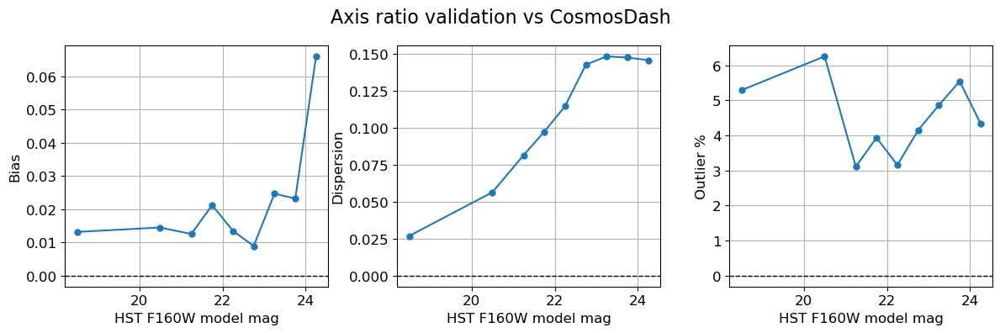

In [94]:
df_plot = df_wide[(df_wide.sep_hst < 1)]

x, y = df_plot['q'].values, df_plot['SERSIC_SERSIC_AXIS_RATIO'].values 

b = y-x
med = np.median(b)
disp = np.quantile(np.abs(b)-med, 0.68)
outl = np.sum(b-med > 3*disp)/df_plot.shape[0]

nb = len(mag_bins_160)-1
B, D, O, weight = np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb), np.repeat(np.nan, nb)
for k in range(nb):
    m1, m2 = mag_bins_160[k], mag_bins_160[k+1]
    df_use = df_plot[(df_plot.mag >= m1) & (df_plot.mag < m2)]
    if df_use.shape[0] > 10 :
        x, y = df_use['q'].values, df_use['SERSIC_SERSIC_AXIS_RATIO'].values 
        b = y-x
        B[k] = np.median(b)
        D[k] = np.quantile(np.abs(b)-B[k], 0.68)
        O[k] = 100*(np.sum(b-B[k] > 3*D[k])/df_use.shape[0])
    weight[k] = df_use.shape[0] / df_plot.shape[0]
        
X = 0.5*(mag_bins_160[1:] + mag_bins_160[:-1])

okB = np.isfinite(B)
wB = np.sum(B[okB]*weight[okB])/np.sum(weight[okB])
okD = np.isfinite(D)
wD = np.sum(D[okD]*weight[okD])/np.sum(weight[okD])
okO = np.isfinite(O)
wO = np.sum(O[okO]*weight[okO])/np.sum(weight[okO])

fig, axs = plt.subplots(1,3, sharex=True, figsize=(12,4))

axs[0].plot(X, B, marker = 'o', markersize=5)
axs[1].plot(X, D, marker = 'o', markersize=5)
axs[2].plot(X, O, marker = 'o', markersize=5)

print('Bias: Overall='+str(np.round(med,2))+' Weighted='+str(np.round(wB,2)))
print('Dispersion : Overall='+str(np.round(disp,2))+' Weighted='+str(np.round(wD,2)))
print('Outlier %: Overall='+str(np.round(outl,2))+' Weighted='+str(np.round(wO,2)))

axs[0].set_ylabel('Bias', fontsize = 12)
axs[1].set_ylabel('Dispersion', fontsize = 12)
axs[2].set_ylabel('Outlier %', fontsize = 12)

for ax in axs.flat:
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.set_xlabel('HST F160W model mag', fontsize = 12)
    ax.tick_params(labelsize = 12)
    ax.grid()

fig.suptitle('Axis ratio validation vs CosmosDash', fontsize = 16)
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/EMC_diag_axis-ratio_vs_CosmosDash_wide.png', format='png')
plt.show()

## Others

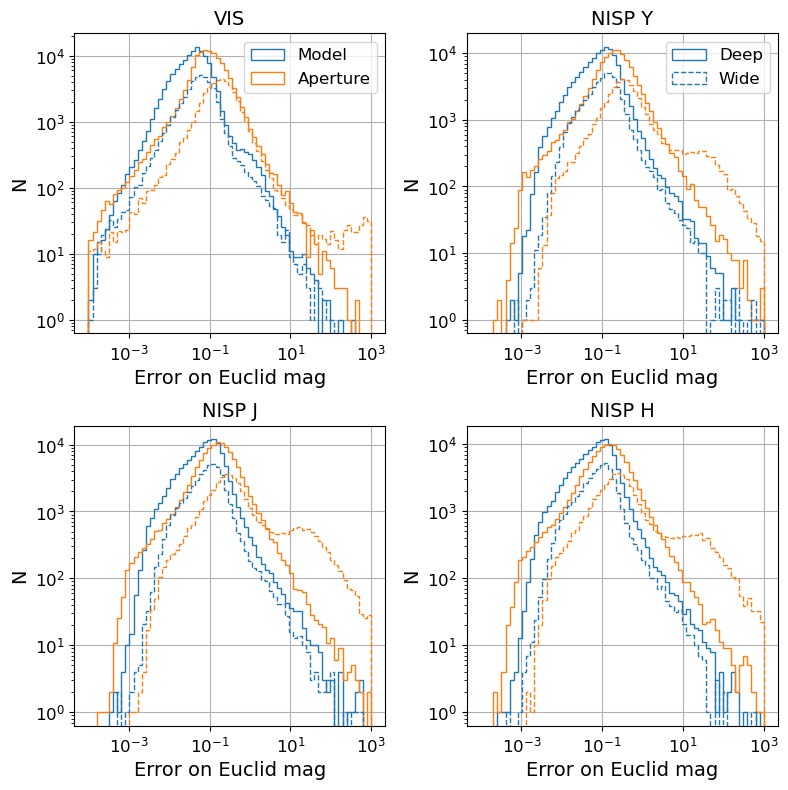

In [95]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

v0, v1 = df_deep['MAGERR_VIS_SERSIC'], df_deep['MAGERR_VIS_APER']
y0, y1 = df_deep['MAGERR_Y_SERSIC'], df_deep['MAGERR_Y_APER']
j0, j1 = df_deep['MAGERR_J_SERSIC'], df_deep['MAGERR_J_APER']
h0, h1 = df_deep['MAGERR_H_SERSIC'], df_deep['MAGERR_H_APER']

axs[0,0].hist(v0, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:blue', label='Model')
axs[0,0].hist(v1, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:orange', label='Aperture')

axs[0,1].hist(y0, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:blue', label='Deep')
axs[0,1].hist(y1, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:orange')

axs[1,0].hist(j0, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:blue')
axs[1,0].hist(j1, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:orange')

axs[1,1].hist(h0, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:blue')
axs[1,1].hist(h1, bins = np.logspace(-4,3,70), histtype='step', edgecolor='tab:orange')

axs[0,0].set_title('VIS', fontsize = 14)
axs[0,1].set_title('NISP Y', fontsize = 14)
axs[1,0].set_title('NISP J', fontsize = 14)
axs[1,1].set_title('NISP H', fontsize = 14)

v0, v1 = df_wide['MAGERR_VIS_SERSIC'], df_wide['MAGERR_VIS_APER']
y0, y1 = df_wide['MAGERR_Y_SERSIC'], df_wide['MAGERR_Y_APER']
j0, j1 = df_wide['MAGERR_J_SERSIC'], df_wide['MAGERR_J_APER']
h0, h1 = df_wide['MAGERR_H_SERSIC'], df_wide['MAGERR_H_APER']

axs[0,0].hist(v0, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:blue')
axs[0,0].hist(v1, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:orange')

axs[0,1].hist(y0, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:blue', label='Wide')
axs[0,1].hist(y1, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:orange')

axs[1,0].hist(j0, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:blue')
axs[1,0].hist(j1, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:orange')

axs[1,1].hist(h0, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:blue')
axs[1,1].hist(h1, bins = np.logspace(-4,3,70), histtype='step', ls='--', edgecolor='tab:orange')

axs[0,0].legend(loc=0, fontsize=12)
axs[0,1].legend(loc=0, fontsize=12)

for ax in axs.flat:
    ax.set_xlabel('Error on Euclid mag', fontsize = 14)
    ax.set_ylabel('N', fontsize = 14)
    ax.grid()
    ax.set(xscale='log', yscale='log')
    #ax.set(xlim = (1,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Euclid_magerr_all_bands_model_aper_deep_wide.png', format='png')
plt.show()